# Análisis exploratorio de demoras en vuelos de aerolíneas
## Esteban Hainze - Coder House - Comisión 49150

# Abstract
En un mundo donde el tiempo es tan preciado como el oro, los retrasos en los vuelos pueden ser más que simples contratiempos. Son instantes de ansiedad para los pasajeros, momentos de estrés para las aerolíneas y complicaciones logísticas para los aeropuertos. En este estudio, nos sumergimos en un vasto conjunto de datos para estudiar los retrasos en los vuelos producidos en los Estados Unidos. Nuestro análisis busca comprender la magnitud de los retrasos, así como su relación con irregularidades estacionales, geográficas y empresariales que los rodean, proporcionando una visión panorámica de la puntualidad en el cielo.

# Motivación
En un aeropuerto, cada minuto cuenta una historia. Los destinos esperan, las conexiones aguardan y los negocios se ponen en pausa. Detrás de cada retraso hay una red de consecuencias que se extienden mucho más allá de las puertas de embarque. Nuestra motivación para este análisis es ingresar en este complejo entramado de datos, entendiendo cómo cada demora impacta a aerolíneas, aeropuertos y pasajeros por igual.

# Audiencia
Desde los altos mandos de las compañías aéreas hasta los administradores de aeropuertos, nuestra audiencia está compuesta por aquellos que tienen un interés directo en el flujo del tráfico aéreo. Son los ejecutivos que buscan mejorar el rendimiento de sus aerolíneas, los gerentes que desean optimizar la eficiencia de sus aeropuertos y las autoridades que se esfuerzan por garantizar una experiencia de viaje sin contratiempos.

# Definición de objetivo
Nuestro objetivo es tejer una narrativa coherente a partir de los datos dispersos, revelando patrones ocultos y tendencias emergentes. Queremos no solo comprender el pasado, sino también anticipar el futuro.

# Contexto comercial
En cada vuelo hay una historia de viaje. Ya sea un viaje de negocios o unas vacaciones, cada vuelo representa una oportunidad para conectar con el mundo. Pero esta conexión es frágil, susceptible a imprevistos, como cambios en el clima, problemas en la logística y en las operaciones de las aerolíneas. En un mundo donde la competencia es feroz y las expectativas son altas, donde todo está cada vez más interconectado, comprender los detalles detrás de los vuelos  es fundamental para mantenerse a la vanguardia en la industria aérea.

# Problema comercial
Los retrasos en los vuelos no son simplemente inconvenientes, son vulnerabilidades, momentos críticos en la red de transporte global, que de no ser previstos, pueden traer consecuencias significativas. Desde cargamentos de mercancías hasta reuniones cruciales, cada demora tiene el potencial de desencadenar una cadena de eventos que pueda afectar a empresas y personas en todo el mundo. Nuestro trabajo es comprender la naturaleza de estos retrasos.

# Contexto analítico
En el vasto universo de datos, cada número cuenta una historia. Desde los picos estacionales hasta las anomalías inesperadas, nuestro análisis busca encontrar el hilo conductor que une estos puntos aparentemente dispersos. Utilizando herramientas de análisis de datos y modelos predictivos, navegamos por este océano de información con el objetivo de iluminar los rincones oscuros de la puntualidad en la aviación.

# Preguntas de interés e hipótesis
Se detallan a continuación una serie de preguntas e hipótesis que resulta de interés analizar en el trabajo, siendo algunas de índole más introductoria, pero con el objetivo de ir profundizando y comprendiendo los elementos y la información del dataset

## Preguntas
1. ¿Cuáles son las aerolíneas con mayor cantidad de registros en el dataset?
2. ¿Cuáles son los años con mayor volumen de vuelos registrados?
3. ¿Cuáles son los años con mayor cantidad de vuelos registrados con demoras de más de 15 minutos?
4. ¿Cuál es el año con mayor probabilidad de demoras en los vuelos?
5. ¿Cuál es el Carrier con mayor cantidad de vuelos registrados?
6. ¿Cuál es el Carrier con mayor cantidad de vuelos registrados con demoras de más de 15 minutos?
7. ¿Cuál es el Carrier con mayor probabilidad de demoras en sus vuelos?
8. ¿Cuál es el Carrier con mayor probabilidad de demoras, y con niveles de demora más grandes relacionadas con problemas de seguridad?
9. ¿Cuál es el Carrier con mayor probabilidad de demoras, y con niveles de demora más grandes relacionadas con problemas de NAS?

## Hipótesis

1. Existen meses en los años analizados que, en promedio, presentan mayor cantidad de demoras en los vuelos, en relación con los vuelos realizados
2. 2020 fue un año con menor cantidad de vuelos debido a la pandemia Covid 19, y puede observarse, al haber una cantidad menor de vuelos, también una cantidad menor en promedio, de vuelos con demoras.
3. Puede predecirse la cantidad de demoras que puede producirse en los vuelos en base a los registros de otras variables registradas

# Análisis Exploratorio de Datos (EDA)

## Montaje Inicial del Dataset

In [ ]:
# Importación de librerías
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import textwrap
import missingno as msno
import scipy
from scipy.stats import pearsonr
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import StratifiedKFold, RandomizedSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from scipy.stats import randint, uniform
!pip install python-dotenv
!pip install scikit-optimize
from dotenv import load_dotenv

# Selección del estilo
plt.style.use('ggplot')

# Configuraciones adicionales
pd.set_option('display.max_colwidth', None)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 1.1 MB/s eta 0:00:00


In [ ]:
# Importación de Google Drive
from google.colab import drive

# Montaje de Google Drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Dataset obtenido de:
# Acceso a la carpeta de la entrega:
# Se crea la variable donde se almacenará el lugar donde se encuentra almacenado el dataset
csv_path_airline_delay = '/content/gdrive/MyDrive/Data Science - Coder House/Trabajo final/Airline Delay Cause.csv'

# Se genera la lectura del csv para crear un DataFrame
df = pd.read_csv(csv_path_airline_delay)

# Se genera un print del DataFrame creado para probar que funcione.
df

,year,month,carrier,carrier_name,airport,airport_name,arr_flights,arr_del15,carrier_ct,weather_ct,...,security_ct,late_aircraft_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
0,2023,8,9E,Endeavor Air Inc.,ABE,"Allentown/Bethlehem/Easton, PA: Lehigh Valley International",89.0,13.0,2.25,1.60,...,0.0,5.99,2.0,1.0,1375.0,71.0,761.0,118.0,0.0,425.0
1,2023,8,9E,Endeavor Air Inc.,ABY,"Albany, GA: Southwest Georgia Regional",62.0,10.0,1.97,0.04,...,0.0,7.42,0.0,1.0,799.0,218.0,1.0,62.0,0.0,518.0
2,2023,8,9E,Endeavor Air Inc.,AEX,"Alexandria, LA: Alexandria International",62.0,10.0,2.73,1.18,...,0.0,4.28,1.0,0.0,766.0,56.0,188.0,78.0,0.0,444.0
3,2023,8,9E,Endeavor Air Inc.,AGS,"Augusta, GA: Augusta Regional at Bush Field",66.0,12.0,3.69,2.27,...,0.0,1.57,1.0,1.0,1397.0,471.0,320.0,388.0,0.0,218.0
4,2023,8,9E,Endeavor Air Inc.,ALB,"Albany, NY: Albany International",92.0,22.0,7.76,0.00,...,0.0,11.28,2.0,0.0,1530.0,628.0,0.0,134.0,0.0,768.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171661,2013,8,YV,Mesa Airlines Inc.,TRI,"Bristol/Johnson City/Kingsport, TN: Tri Cities",7.0,1.0,0.78,0.00,...,0.0,0.00,0.0,0.0,23.0,18.0,0.0,5.0,0.0,0.0
171662,2013,8,YV,Mesa Airlines Inc.,YUM,"Yuma, AZ: Yuma MCAS/Yuma International",2.0,1.0,0.00,0.00,...,0.0,1.00,0.0,0.0,17.0,0.0,0.0,0.0,0.0,17.0
171663,2013,8,YV,Mesa Airlines Inc.,SLC,"Salt Lake City, UT: Salt Lake City International",2.0,0.0,0.00,0.00,...,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
171664,2013,8,DL,Delta Air Lines Inc.,SBN,"South Bend, IN: South Bend International",1.0,1.0,1.00,0.00,...,0.0,0.00,0.0,0.0,18.0,18.0,0.0,0.0,0.0,0.0


In [ ]:
#Se hace un describe para ver datos relevantes del dataframe
df.describe()

,year,month,arr_flights,arr_del15,carrier_ct,weather_ct,nas_ct,security_ct,late_aircraft_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
count,171666.000000,171666.000000,171426.000000,171223.000000,171426.000000,171426.000000,171426.000000,171426.000000,171426.000000,171426.000000,171426.000000,171426.00000,171426.000000,171426.000000,171426.000000,171426.000000,171426.000000
mean,2018.551361,6.493633,362.528467,66.434387,20.796615,2.250347,19.381147,0.157096,23.770554,7.530497,0.863387,4239.48733,1437.185124,222.563497,920.651704,7.382725,1651.700063
std,2.890006,3.440908,992.894662,179.540694,50.315176,7.314252,61.675244,0.717405,72.393477,43.654880,3.772853,12618.56605,4215.677812,821.086511,3423.509335,41.779985,5221.878385
min,2013.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2016.000000,4.000000,50.000000,6.000000,2.160000,0.000000,1.000000,0.000000,1.230000,0.000000,0.000000,335.00000,110.000000,0.000000,34.000000,0.000000,65.000000
50%,2019.000000,7.000000,100.000000,17.000000,6.400000,0.400000,3.910000,0.000000,5.000000,1.000000,0.000000,1018.00000,375.000000,18.000000,146.000000,0.000000,320.000000
75%,2021.000000,9.000000,250.000000,47.000000,17.260000,1.860000,11.710000,0.000000,15.260000,4.000000,1.000000,2884.00000,1109.000000,146.000000,477.000000,0.000000,1070.000000
max,2023.000000,12.000000,21977.000000,4176.000000,1293.910000,266.420000,1884.420000,58.690000,2069.070000,4951.000000,197.000000,438783.00000,196944.000000,31960.000000,112018.000000,3760.000000,227959.000000


In [ ]:
#Se obtiene información incial de las distintas columnas, así como el cumplimiento de entradas y de columnas
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 171666 entries, 0 to 171665
Data columns (total 21 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   year                 171666 non-null  int64  
 1   month                171666 non-null  int64  
 2   carrier              171666 non-null  object 
 3   carrier_name         171666 non-null  object 
 4   airport              171666 non-null  object 
 5   airport_name         171666 non-null  object 
 6   arr_flights          171426 non-null  float64
 7   arr_del15            171223 non-null  float64
 8   carrier_ct           171426 non-null  float64
 9   weather_ct           171426 non-null  float64
 10  nas_ct               171426 non-null  float64
 11  security_ct          171426 non-null  float64
 12  late_aircraft_ct     171426 non-null  float64
 13  arr_cancelled        171426 non-null  float64
 14  arr_diverted         171426 non-null  float64
 15  arr_delay        

## Análisis y revisión de datos duplicados y nulos
Se analiza la existencia de datos duplicados

In [ ]:
# Revisión de datos duplicados en el dataset.
duplicated_rows = df.duplicated().sum()
print(f'Total de filas duplicadas: {duplicated_rows}')

Total de filas duplicadas: 0


Al no haber datos duplicados, se procede a analizar la presencia de datos nulos.

In [ ]:
# Se verifica que no hayan quedado datos nulos
df.isnull().sum()

year                     0
month                    0
carrier                  0
carrier_name             0
airport                  0
airport_name             0
arr_flights            240
arr_del15              443
carrier_ct             240
weather_ct             240
nas_ct                 240
security_ct            240
late_aircraft_ct       240
arr_cancelled          240
arr_diverted           240
arr_delay              240
carrier_delay          240
weather_delay          240
nas_delay              240
security_delay         240
late_aircraft_delay    240
dtype: int64

Al verificar su existencia, se utilizan distintas visualizaciones para identificar su naturaleza.

<Axes: >

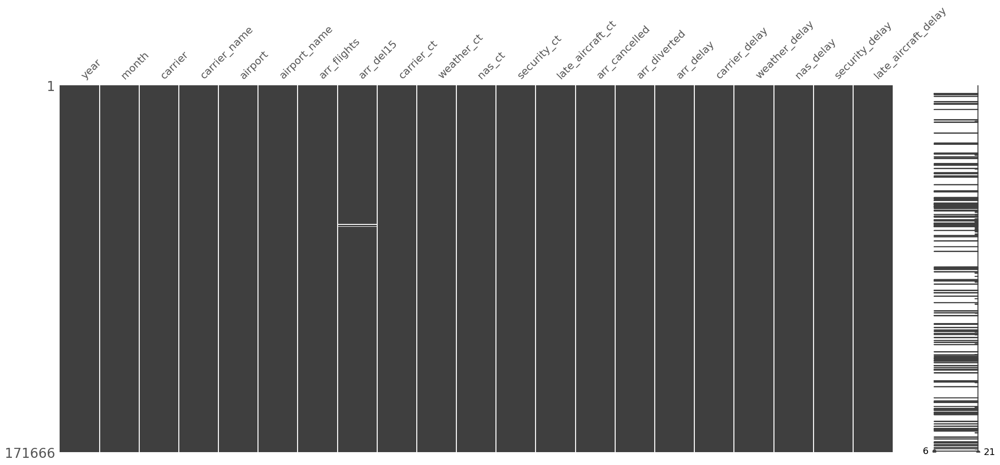

In [ ]:
# Visualización tipo matriz
msno.matrix(df)

Se observa una mayor cantidad de datos nulos en la filla arr_del15 con respecto al resto.

<Axes: >

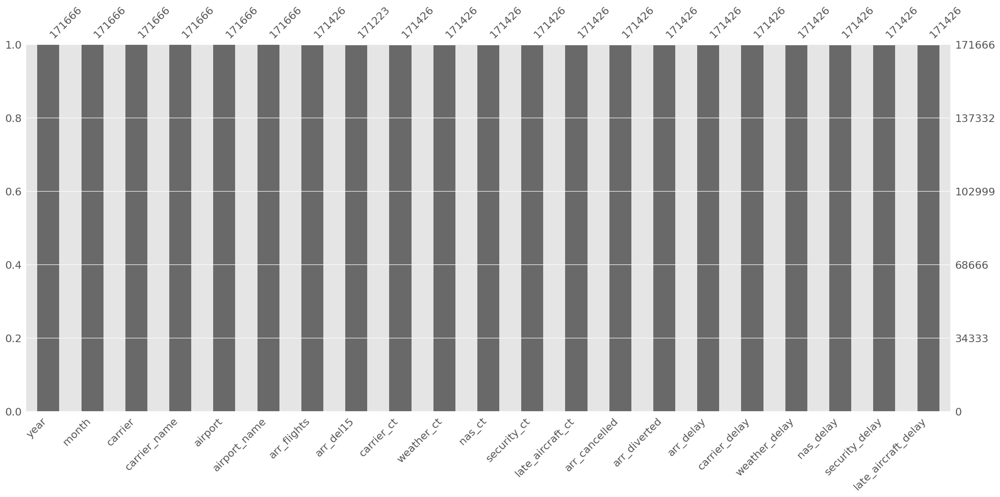

In [ ]:
# Visualización con barras
msno.bar(df)

Se confirma lo observado en la matriz anterior: la diferencia de datos no nulos entre estas columnas.

<Axes: >

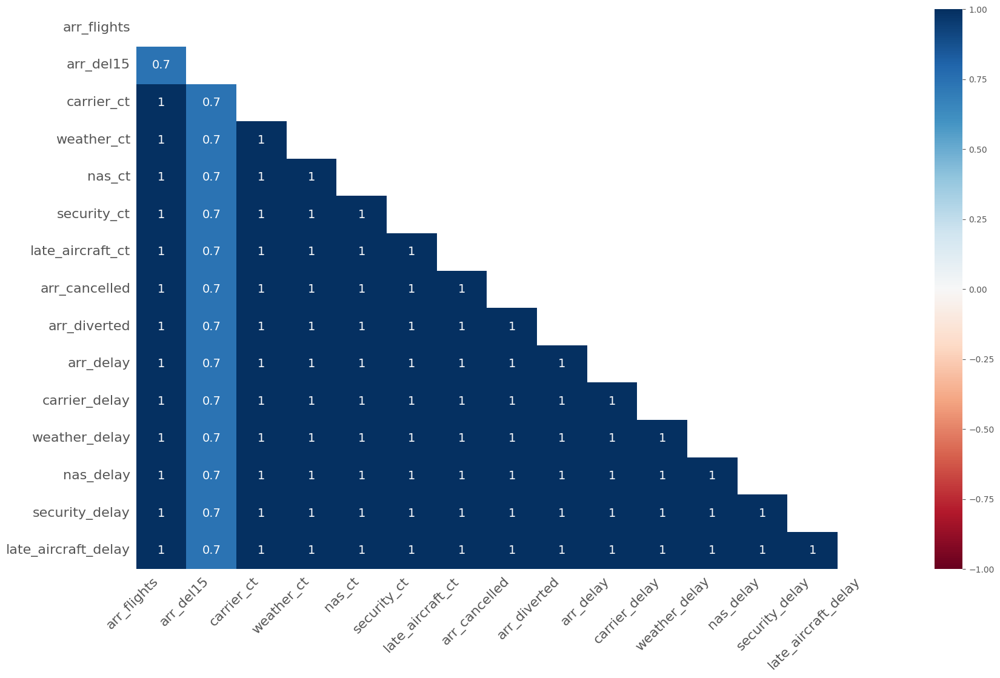

In [ ]:
# Visualización con heatmap
msno.heatmap(df)

Al utilizar el heatmap, se observa una alta correlación entre la mayoría de los nulos, habiendo unos nulos no interrelacionados con el resto únicamente en arr_del15

<Axes: >

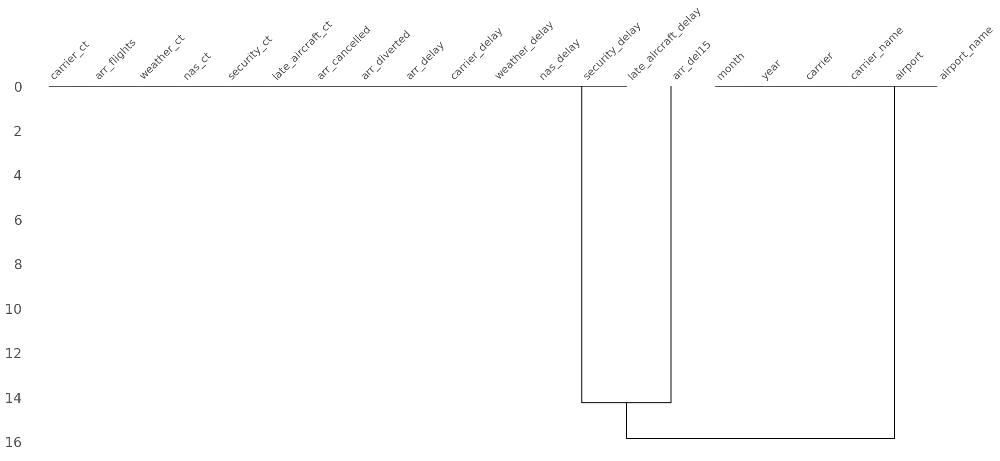

In [ ]:
msno.dendrogram(df)

En este gráfico se observan que las columnas se separan en tres tipos, en base a los nulos que presentan: de month a airport_name: no presentan nulos, de carrier_ct a late_aircraft delay presentan nulos en forma similar, todos a la vez, por lo que están interrelacioandos, y cuando se analizan de cerca, se observa que son datos que están completamente en cero, más allá de las celdas con datos de tipo text. Por último, los nulos de la columna arr_del15, siguen dos patrones:
1. cuando siguen el mismo patrón de nulidad que las otras columnas con datos nulos.
2. cuando no siguen el patrón de nulidad de las otras columnas con datos nulos. En este caso, se observa que siempre está compuesta por datos en cero en todas las columnas, excepto en arr_cancelled, donde se observa el mismo valor para ese campo que en arr_flights.

En base a esto, se concluye proceder con dos cursos de acción distintos, dependiendo los datos nulos por fila:
1. Para los casos en que los dos grupos con datos nulos coinciden, eliminar las columnas.
2. Para los casos en que solo arr_del15 presenta datos nulos, se decide rellenar estas celdas con cero ('0'), ya que, por lógica, corresponde con la información ya cargada

Para hacer esto en forma rápida y eficiente, primero se reemplazarán los datos nulos de arr_del15 por ceros ('0'), y luego se eliminarán las filas que contengan los datos nulos, ya que de esta manera se ejecutará más rápido, y en aquellas filas en que hubieran más datos nulos, que son aquellas que se querían borrar, se eliminarán igualmente de la misma forma.

In [ ]:
dfprueba = df
dfprueba['arr_del15'].fillna(0, inplace=True)

In [ ]:
dfprueba = dfprueba.dropna()
dfprueba.isnull().sum()

year                   0
month                  0
carrier                0
carrier_name           0
airport                0
airport_name           0
arr_flights            0
arr_del15              0
carrier_ct             0
weather_ct             0
nas_ct                 0
security_ct            0
late_aircraft_ct       0
arr_cancelled          0
arr_diverted           0
arr_delay              0
carrier_delay          0
weather_delay          0
nas_delay              0
security_delay         0
late_aircraft_delay    0
dtype: int64

In [ ]:
dfprueba.shape

(171426, 21)

Al confirmar que el proceso funcionó correctamente, se unifica con el dataframe original

In [ ]:
df = dfprueba
df.shape

(171426, 21)

In [ ]:
df.describe()

,year,month,arr_flights,arr_del15,carrier_ct,weather_ct,nas_ct,security_ct,late_aircraft_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
count,171426.000000,171426.000000,171426.000000,171426.000000,171426.000000,171426.000000,171426.000000,171426.000000,171426.000000,171426.000000,171426.000000,171426.00000,171426.000000,171426.000000,171426.000000,171426.000000,171426.000000
mean,2018.551194,6.492860,362.528467,66.355716,20.796615,2.250347,19.381147,0.157096,23.770554,7.530497,0.863387,4239.48733,1437.185124,222.563497,920.651704,7.382725,1651.700063
std,2.890212,3.440977,992.894662,179.448903,50.315176,7.314252,61.675244,0.717405,72.393477,43.654880,3.772853,12618.56605,4215.677812,821.086511,3423.509335,41.779985,5221.878385
min,2013.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2016.000000,4.000000,50.000000,6.000000,2.160000,0.000000,1.000000,0.000000,1.230000,0.000000,0.000000,335.00000,110.000000,0.000000,34.000000,0.000000,65.000000
50%,2019.000000,7.000000,100.000000,17.000000,6.400000,0.400000,3.910000,0.000000,5.000000,1.000000,0.000000,1018.00000,375.000000,18.000000,146.000000,0.000000,320.000000
75%,2021.000000,9.000000,250.000000,47.000000,17.260000,1.860000,11.710000,0.000000,15.260000,4.000000,1.000000,2884.00000,1109.000000,146.000000,477.000000,0.000000,1070.000000
max,2023.000000,12.000000,21977.000000,4176.000000,1293.910000,266.420000,1884.420000,58.690000,2069.070000,4951.000000,197.000000,438783.00000,196944.000000,31960.000000,112018.000000,3760.000000,227959.000000


## Análisis general inicial
Para comenzar con el análisis de la información en el dataset, lo primero que se buscó realizar es un pairplot de las variables, con el fin de identificar la existencia de correlaciones entre los distintos campos en forma general.

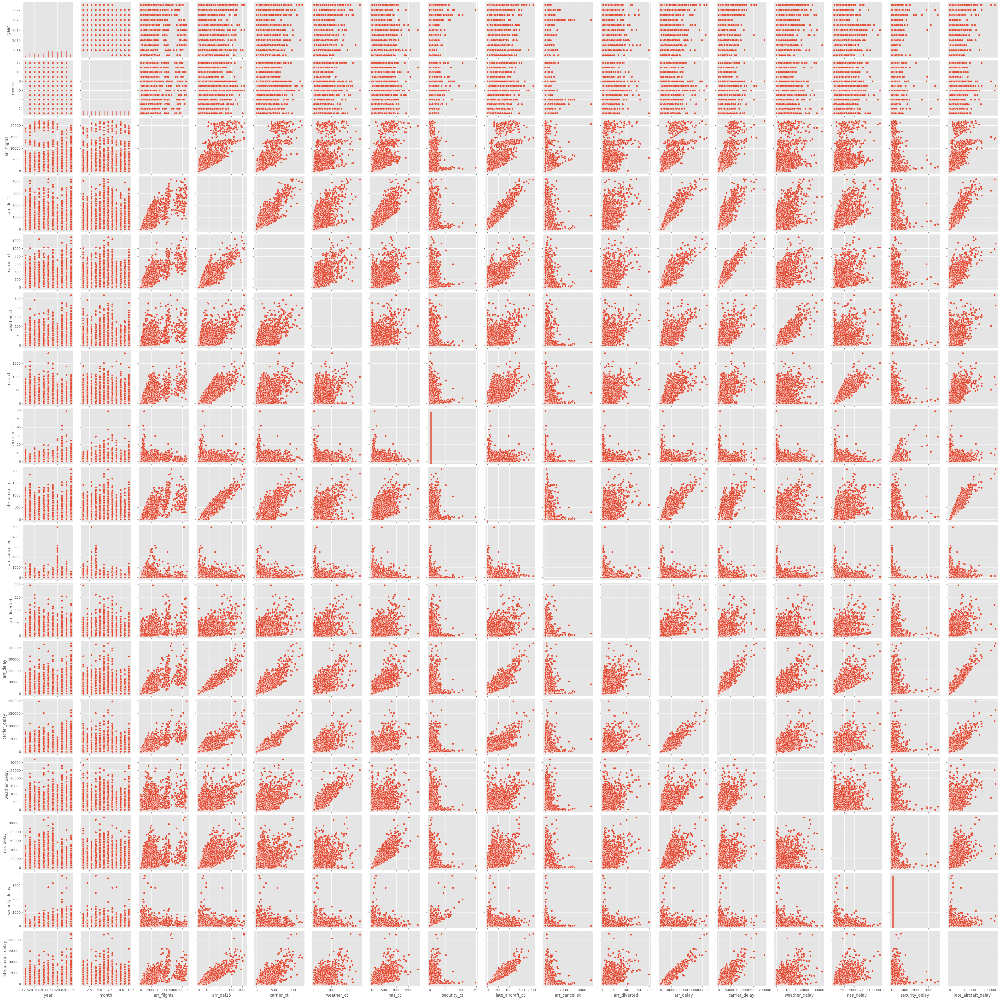

In [ ]:
sns.pairplot(df)

En base a la observación que es posible realizarse sobre los resultados, puede identificarse algunas correlaciones iniciales entre algunas variables, lo que indica que pueden haber aparentes correlaciones entre algunos de los campos. Se considera que, en caso de subdividirse el dataset, o analizar porciones más pequeñas y específicas del mismo, dichas correlaciones pueden incrementarse.

Algunas aparentes correlaciones observadas:
* arr_del15 con late_aircraft_delay
* arr_del15 con arr_delay
* arr_del15 con late_aircraft_ct
* arr_del15 con nas_ct
* arr_del15 con carrier_ct
* carrier_ct con carrier_delay
* carrier_ct con arr_delay
* nas_ct con nas_delay
* late_aircraft_ct con late_aircraft_delay
* late_aircraft_ct con arr_delay
* arr_delay con late_aircraft_delay
* arr_delay con carrier_delay
* weather_delay con weather_ct

Para confirmarlo, se realiza un cálculo del coeficiente de Pearson entre estas columnas, al ser todas variables de tipo numérica.

In [ ]:
combinations = [
    ('arr_del15', 'late_aircraft_delay'),
    ('arr_del15', 'arr_delay'),
    ('arr_del15', 'late_aircraft_ct'),
    ('arr_del15', 'nas_ct'),
    ('arr_del15', 'carrier_ct'),
    ('carrier_ct', 'carrier_delay'),
    ('carrier_ct', 'arr_delay'),
    ('nas_ct', 'nas_delay'),
    ('late_aircraft_ct', 'late_aircraft_delay'),
    ('late_aircraft_ct', 'arr_delay'),
    ('arr_delay', 'late_aircraft_delay'),
    ('arr_delay', 'carrier_delay'),
    ('weather_delay', 'weather_ct')
]

# Calcular los coeficientes de Pearson para cada combinación
for var1, var2 in combinations:
    pearson_coef, p_value = pearsonr(df[var1], df[var2])
    print(f"Coeficiente de Pearson entre '{var1}' y '{var2}': {pearson_coef}")

Coeficiente de Pearson entre 'arr_del15' y 'late_aircraft_delay': 0.9505111828502051
Coeficiente de Pearson entre 'arr_del15' y 'arr_delay': 0.967578211884582
Coeficiente de Pearson entre 'arr_del15' y 'late_aircraft_ct': 0.9629772185294486
Coeficiente de Pearson entre 'arr_del15' y 'nas_ct': 0.9140903703166264
Coeficiente de Pearson entre 'arr_del15' y 'carrier_ct': 0.941991022028271
Coeficiente de Pearson entre 'carrier_ct' y 'carrier_delay': 0.9353232257301584
Coeficiente de Pearson entre 'carrier_ct' y 'arr_delay': 0.9086772249013128
Coeficiente de Pearson entre 'nas_ct' y 'nas_delay': 0.9476353607645095
Coeficiente de Pearson entre 'late_aircraft_ct' y 'late_aircraft_delay': 0.964564363996175
Coeficiente de Pearson entre 'late_aircraft_ct' y 'arr_delay': 0.9197740725589708
Coeficiente de Pearson entre 'arr_delay' y 'late_aircraft_delay': 0.9648901133893918
Coeficiente de Pearson entre 'arr_delay' y 'carrier_delay': 0.9425942185417857
Coeficiente de Pearson entre 'weather_delay' y 

Al observarse todos valores cercanos a 1, se considera que tienen correlaciones de tipo fuerte, confirmándose lo analizado previamente.

Se presenta a continuación la descripción estadística de Scipy Stats para cada una de las variables numéricas.

In [ ]:
# Seleccionar solo las variables numéricas
numeric_variables = df.select_dtypes(include=['int', 'float']).columns

# Iterar sobre cada variable numérica y aplicar describe
for column in numeric_variables:
    description = scipy.stats.describe(df[column])
    print(f"Variable: {column}")
    print(description)
    print("\n")

Variable: year
DescribeResult(nobs=171426, minmax=(2013, 2023), mean=2018.5511941012448, variance=8.353327814306406, skewness=-0.2537442693892497, kurtosis=-1.024385239853755)


Variable: month
DescribeResult(nobs=171426, minmax=(1, 12), mean=6.492859892898394, variance=11.840325276411885, skewness=-0.0028862917864798934, kurtosis=-1.2050392002857118)


Variable: arr_flights
DescribeResult(nobs=171426, minmax=(1.0, 21977.0), mean=362.52846709367304, variance=985839.8102702673, skewness=8.435399799825328, kurtosis=114.38123156000995)


Variable: arr_del15
DescribeResult(nobs=171426, minmax=(0.0, 4176.0), mean=66.35571616907588, variance=32201.908810171946, skewness=7.256887841773773, kurtosis=78.69482625546775)


Variable: carrier_ct
DescribeResult(nobs=171426, minmax=(0.0, 1293.91), mean=20.79661539089753, variance=2531.6169058697155, skewness=6.995617406079856, kurtosis=75.51227668591275)


Variable: weather_ct
DescribeResult(nobs=171426, minmax=(0.0, 266.42), mean=2.2503467385344114,

No se realiza un análisis para eliminación de outliers ya que se considera que todos los datos son relevantes para un análisis fiel de los datos, debido a la amplia variedad de los datos, y al ser estos representativos de los distintos registros de aeropuertos, carriers y vuelos registrados por mes y año, los cuales pueden variar desde valores muy bajos a valores muy altos, razón por la cual se considera que todos los datos son relevantes y que no hace falta, ni se considera adecuado removerlos.

# Análisis de preguntas e hipótesis


## Preguntas
A la hora de realizar el análisis de la información del dataset, se fue avanzando de información más general a más específica, más procesada, por lo cual podrá observarse dicha progresión en las preguntas analizadas.

### 1. ¿Cuáles son las aerolíneas con mayor cantidad de registros en el dataset?

In [ ]:
# Se aplica un value counts para saber la cantidad de registros por Carrier
conteo_carriers = df['carrier_name'].value_counts()

print(conteo_carriers)

carrier_name
SkyWest Airlines Inc.           25538
Delta Air Lines Inc.            16678
Envoy Air                       11870
American Airlines Inc.          11814
United Air Lines Inc.           11248
Southwest Airlines Co.          11109
ExpressJet Airlines Inc.        10124
Frontier Airlines Inc.           9098
Alaska Airlines Inc.             8366
Allegiant Air                    8279
Endeavor Air Inc.                7578
JetBlue Airways                  7552
Mesa Airlines Inc.               6353
PSA Airlines Inc.                6189
Republic Airline                 5709
Spirit Air Lines                 4698
Hawaiian Airlines Inc.           2157
US Airways Inc.                  1708
ExpressJet Airlines LLC          1425
Horizon Air                      1157
Virgin America                   1133
American Eagle Airlines Inc.     1044
AirTran Airways Corporation       599
Name: count, dtype: int64


In [ ]:
fig3 = px.histogram(df, x='carrier_name', color_discrete_sequence=['coral'])
fig3.update_layout(
    title='Quantity of flight registries per Carrier',
    xaxis_title='Carrier',
    yaxis_title='Quantity',
    width=800,
    height=600
)
fig3.update_xaxes(tickangle=90, tickfont=dict(size=10))
fig3.show()

En este conteo, puede observarse que la cantidad de registros por Carrier marca como principales aerolíneas a:

1. SkyWest Airlines (25593 registros)
2. Delta Air Lines (16725 registros)
3. Envoy Air (11886 registros)
4. American Airlines (11816 registros)
5. United Air Lines (11262 registros)

Este dato resulta de utilidad, ya que si bien no representan con exactitud el volumen de vuelos realizados por carrier, si representan el grado de cobertura en distintos aeropuertos y a lo largo del tiempo, ya que entre más aeropuertos y por más tiempo cubren, presentan una mayor cantidad de registros, por lo que afecta a la representatividad y presencia del carrier a nivel nacional.

### 2. ¿Cuáles son los años con mayor volumen de vuelos registrados?

In [ ]:
sum_arr_flights_per_year = df.groupby('year')['arr_flights'].sum()
print(sum_arr_flights_per_year)

year
2013    2629106.0
2014    5819811.0
2015    5819079.0
2016    5617658.0
2017    5674621.0
2018    7206195.0
2019    7422037.0
2020    4688354.0
2021    5995397.0
2022    6729125.0
2023    4545422.0
Name: arr_flights, dtype: float64


In [ ]:
# Crear el gráfico utilizando Plotly Express
fig4 = px.bar(x=sum_arr_flights_per_year.index.astype(str), y=sum_arr_flights_per_year, color_discrete_sequence=['coral'],
             labels={'x':'Year', 'y':'Quantity of flights'},
             title='Flights per year', width=800, height=600)

# Mostrar el gráfico
fig4.show()

Este análisis nos permite identificar como años con mayor flujo de vuelos al año 2019, seguido de 2018 y 2022, con algo más atrás a 2021 y 2014. Esto permite ver que se alcanzó el pico de vuelos antes de la pandemia de 2020, donde hubo una disminución de los vuelos, y que luego se comenzó a recuperar en 2021, aunque continúa en recuperación.

### 3. ¿Cuáles son los años con mayor cantidad de vuelos registrados con demoras de más de 15 minutos?

In [ ]:
sum_arr_del15_per_year = df.groupby('year')['arr_del15'].sum()
print (sum_arr_del15_per_year)

year
2013     493432.0
2014    1240528.0
2015    1063439.0
2016     964239.0
2017    1029474.0
2018    1352165.0
2019    1389253.0
2020     431921.0
2021    1010332.0
2022    1376798.0
2023    1023514.0
Name: arr_del15, dtype: float64


In [ ]:
# Crear el gráfico utilizando Plotly Express
fig5 = px.bar(x=sum_arr_del15_per_year.index.astype(str), y=sum_arr_del15_per_year, color_discrete_sequence=['coral'],
             labels={'x':'Year', 'y':'Flights with more than 15 minutes delay'},
             title='Flight delays by +15 minutes per year', width=800, height=600)

# Mostrar el gráfico
fig5.show()

En base a los resultados obtenidos, puede observarse que 2019 es el año con mayor registro de demoras, seguido por 2022 y 2018, y ya más detrás 2014 y 2015. Esto guarda una bastante estrecha relación con la cantidad de vuelos realizados en cada año, ya que, salvo por el mayor volumen de demoras en 2014 y 2015, los primeros tres años con mayor cantidad de vuelos y de demoras es la misma. Se puede ver, por tanto, un indicio de mejora en el porcentaje de demoras producidas en comparación con la cantidad de los vuelos a lo largo de los años.

### 4. ¿Cuál es el año con mayor probabilidad de demoras en los vuelos?


In [ ]:
perc_arr_del15_y_vs_arr_flights_y = sum_arr_del15_per_year/sum_arr_flights_per_year *100
print(perc_arr_del15_y_vs_arr_flights_y)

year
2013    18.768053
2014    21.315606
2015    18.275040
2016    17.164430
2017    18.141723
2018    18.763925
2019    18.717948
2020     9.212636
2021    16.851795
2022    20.460283
2023    22.517469
dtype: float64


Se puede observar que el año con mayor porcentaje de demoras, en relación con la cantidad de los vuelos en el mismo período es el de 2023 (22.51%), seguido por el año 2014 (21.31%) y por 2022 (20.46%), y finalizado por 2013 y 2018 (18.76% cada uno). En contraste, el año con menor porcentaje de demoras resultó ser 2020, un año con particularmente baja cantidad de vuelos por la pandamia de Covid 19.

### 5. ¿Cuál es el Carrier con mayor cantidad de vuelos registrados?

In [ ]:
# Agrupar por 'carrier_name' y sumar los valores en 'arr_flights'
sum_arr_flights = df.groupby('carrier_name')['arr_flights'].sum()

# Ordenar los resultados en orden descendente
sum_arr_flights_sorted = sum_arr_flights.sort_values(ascending=False)

print(sum_arr_flights_sorted)

carrier_name
Southwest Airlines Co.          12522217.0
Delta Air Lines Inc.             8661561.0
American Airlines Inc.           7973061.0
SkyWest Airlines Inc.            6905056.0
United Air Lines Inc.            5464237.0
ExpressJet Airlines Inc.         2637669.0
JetBlue Airways                  2609697.0
Envoy Air                        2073685.0
Alaska Airlines Inc.             1990957.0
Republic Airline                 1717781.0
Spirit Air Lines                 1526076.0
Endeavor Air Inc.                1466178.0
PSA Airlines Inc.                1326337.0
Frontier Airlines Inc.           1158943.0
Mesa Airlines Inc.                914298.0
US Airways Inc.                   784157.0
Hawaiian Airlines Inc.            727265.0
Allegiant Air                     613357.0
Virgin America                    301908.0
American Eagle Airlines Inc.      279283.0
Horizon Air                       200419.0
ExpressJet Airlines LLC           149234.0
AirTran Airways Corporation       143429.

In [ ]:
# Convertir la serie a un DataFrame para facilitar su manejo con Plotly Express
sum_arr_flights_sorted = sum_arr_flights_sorted.reset_index()
sum_arr_flights_sorted.columns = ['Carrier Name', 'Flight count']

In [ ]:
# Crear el gráfico utilizando Plotly Express
fig6 = px.bar(sum_arr_flights_sorted, x='Carrier Name', y='Flight count', color_discrete_sequence=['coral'],
             labels={'Carrier Name':'Carrier Name', 'Flight count':'Flight count'},
             title='Flights per carrier',
             width=800,
             height=600)

# Personalizar la rotación de las etiquetas del eje x
fig6.update_xaxes(tickangle=90, tickmode='array', tickvals=sum_arr_flights_sorted['Carrier Name'])

# Mostrar el gráfico
fig6.show()

En este análisis puede observarse que, a pesar de lo observado en el análisis de registro de vuelos por carrier, el carrier con mayor volumen de vuelos no resulta ser SkyWest Airlines, sino Southwest Airlines (con 12.5 millones de vuelos), seguido de Delta Air Lines (8.6 millones), American Airlines (7.9 millones), y luego recién SkyWest Airlines (6.9 millones) y United Air Lines (5.4 millones). Esto demuestra lo anteriormente enunciado, que mayor representatividad no implicaba mayor cantidad de vuelos programados.

### 6. ¿Cuál es el Carrier con mayor cantidad de vuelos registrados con demoras de más de 15 minutos?

In [ ]:
# Agrupar por 'carrier_name' y sumar los valores en 'arr_del15'
sum_arr_del15_carrier = df.groupby('carrier_name')['arr_del15'].sum()

# Ordenar los resultados en orden descendente
sum_arr_del15_carrier_sorted = sum_arr_del15_carrier.sort_values(ascending=False)

# Convertir la serie a un DataFrame
sum_arr_del15_carrier = sum_arr_del15_carrier_sorted.reset_index()
sum_arr_del15_carrier.columns = ['Carrier Name', 'Sum of arr_del15']

print(sum_arr_del15_carrier)

                    Carrier Name  Sum of arr_del15
0         Southwest Airlines Co.         2460563.0
1         American Airlines Inc.         1538261.0
2           Delta Air Lines Inc.         1198884.0
3          SkyWest Airlines Inc.         1167810.0
4          United Air Lines Inc.         1030741.0
5                JetBlue Airways          647919.0
6       ExpressJet Airlines Inc.          540578.0
7                      Envoy Air          394625.0
8               Spirit Air Lines          330708.0
9           Alaska Airlines Inc.          317730.0
10        Frontier Airlines Inc.          291403.0
11              Republic Airline          270036.0
12             PSA Airlines Inc.          231648.0
13             Endeavor Air Inc.          200559.0
14            Mesa Airlines Inc.          170060.0
15                 Allegiant Air          149943.0
16               US Airways Inc.          134516.0
17        Hawaiian Airlines Inc.           89794.0
18                Virgin Americ

In [ ]:
# Crear el gráfico utilizando Plotly Express
fig7 = px.bar(sum_arr_del15_carrier, x='Carrier Name', y='Sum of arr_del15', color_discrete_sequence=['coral'],
             labels={'Carrier Name':'Carrier Name', 'Delays by more than 15 minutes count':'Delays count'},
             title='Delays by more than 15 minutes per carrier',
             width=800,
             height=600)

# Personalizar la rotación de las etiquetas del eje x
fig7.update_xaxes(tickangle=90, tickmode='array', tickvals=sum_arr_del15_carrier['Carrier Name'])

# Mostrar el gráfico
fig7.show()

En este análisis puede observarse que, como podría esperarse, los cinco principales carriers en cantidad de vuelos son también, en el mismo orden, los mismos principales carriers en cantidad de vuelos con demoras. Pueden observarse, sin embargo, pequeñas variaciones en el resto de carriers.

### 7. ¿Cuál es el Carrier con mayor probabilidad de demoras en sus vuelos?

In [ ]:
perc_del15_vs_flights_carrier = (sum_arr_del15_carrier_sorted/sum_arr_flights_sorted * 100).sort_values(ascending=False)
print(perc_del15_vs_flights_carrier)

carrier_name
Frontier Airlines Inc.          25.143860
JetBlue Airways                 24.827365
Allegiant Air                   24.446285
American Eagle Airlines Inc.    21.888908
Spirit Air Lines                21.670480
Virgin America                  21.398903
ExpressJet Airlines Inc.        20.494535
ExpressJet Airlines LLC         19.882869
Southwest Airlines Co.          19.649580
American Airlines Inc.          19.293230
Envoy Air                       19.030132
United Air Lines Inc.           18.863402
Mesa Airlines Inc.              18.600063
AirTran Airways Corporation     17.587796
PSA Airlines Inc.               17.465245
US Airways Inc.                 17.154218
SkyWest Airlines Inc.           16.912390
Alaska Airlines Inc.            15.958657
Republic Airline                15.720048
Horizon Air                     14.311018
Delta Air Lines Inc.            13.841431
Endeavor Air Inc.               13.679035
Hawaiian Airlines Inc.          12.346806
dtype: float64


En base a los resultados obtenidos, puede observarse que los carriers con mayor cantidad de vuelos con demoras son Frontier Airlines (25.1%), JetBlue Airways (24.82%) y Allegiant Air (24.4%), mientras que los que tienen menor porcentaje de demoras son Hawaiian Airlines (12.3%), Endeavor Air (13.6%) y Delta Air Lines (13.8%), siendo esta última una de las del top 5 en cantidad de vuelos, y teniendo el tercer menor porcentaje en cantidad de vuelos con demoras. Por su parte, de los carriers del top 5, el que presenta peores valores resulta ser Southwest Airlines (19.6%)

### 8. ¿Cuál es el Carrier con mayor probabilidad de demoras, y con nivel de demora más grande relacionada con problemas de seguridad?
Para realizar este cálculo de una forma eficiente, teniendo en cuenta que, a mayor volumen de vuelos realizados, los valores serían mayores, se resolvió realizar una sumatoria de los valores por empresa en arr_flights y en security_ct para la primera parte de la pregunta, y en security_delay para la segunda parte de la pregunta, para luego dividir security_ct y security_delay por arr_flights. De esta forma, los resultados serían justos y proporcionales a la cantidad de vuelos de cada compañía.

In [ ]:
# Calcular la suma de security_ct y arr_flights por carrier
sum_security_ct = df.groupby('carrier_name')['security_ct'].sum()
sum_arr_flights = df.groupby('carrier_name')['arr_flights'].sum()

# Crear un DataFrame con estas sumas
df_flight_sec_sums = pd.DataFrame({'security_ct_sum': sum_security_ct, 'arr_flights_sum': sum_arr_flights})

# Calcular la columna con el resultado de la división
df_flight_sec_sums['security_per_flight'] = df_flight_sec_sums['security_ct_sum'] / df_flight_sec_sums['arr_flights_sum']

# Seleccionar los 10 principales carriers
top_10_carriers = df_flight_sec_sums['security_per_flight'].nlargest(10)

fig8 = px.bar(x=top_10_carriers.index, y=top_10_carriers.values,
             labels={'x': 'Carrier', 'y': 'Security Count per Flight'},
             color_discrete_sequence=['coral'],
             title='Top 10 Carriers with Highest Security Count per Flight',
             width=800)
fig8.update_layout(xaxis={'categoryorder': 'total descending', 'tickangle': 90})
fig8.show()

Se observa que Spirit Airlines es la compañía con mayor cantidad de demoras relacionadas con problemas de seguridad, seguida por Allegiant Air y Alaska Airlines un poco más alejadas.

In [ ]:
# Calcular la suma de security_ct y arr_flights por carrier
sum_security_delay = df.groupby('carrier_name')['security_delay'].sum()

# Crear un DataFrame con estas sumas
df_sec_del_sums = pd.DataFrame({'security_delay_sum': sum_security_delay, 'arr_flights_sum': sum_arr_flights})

# Calcular la columna con el resultado de la división
df_sec_del_sums['security_delay_per_flight'] = df_sec_del_sums['security_delay_sum'] / df_sec_del_sums['arr_flights_sum']

# Seleccionar los 10 principales carriers
top_10_carriers = df_sec_del_sums['security_delay_per_flight'].nlargest(10)

fig9 = px.bar(x=top_10_carriers.index, y=top_10_carriers.values,
             labels={'x': 'Carrier', 'y': 'Security Delay per Flight'},
             color_discrete_sequence=['coral'],
             title='Top 10 Carriers with Highest Security Delay per Flight',
             width=800)
fig9.update_layout(xaxis={'categoryorder': 'total descending', 'tickangle': 90})
fig9.show()

Por su parte, en lo que respecta al mayor nivel de demora por problemas de seguridad, se observa que se repiten Spirit Air Lines y Allegiant Air, pero el tercer lugar pasa a ser ocupado por Virgin America. Se observa que la diferencia entre la primera empresa y el resto resulta menor que en la primera gráfica, aunque sigue siendo muy por encima del resto (casi 25% de diferencia con el segundo)

### 9. ¿Cuál es el Carrier con mayor probabilidad de demoras, y con niveles de demora más grandes relacionadas con problemas de NAS?

Aquí nuevamente, el proceso realizado es el mismo que en la pregunta anterior, solo que con nas_ct y nas_delay.

In [ ]:
# Calcular la suma de nas_ct y arr_flights por carrier
sum_nas_ct = df.groupby('carrier_name')['nas_ct'].sum()

# Crear un DataFrame con estas sumas
df_sums = pd.DataFrame({'nas_ct_sum': sum_nas_ct, 'arr_flights_sum': sum_arr_flights})

# Calcular la columna con el resultado de la división
df_sums['nas_ct_per_flight'] = df_sums['nas_ct_sum'] / df_sums['arr_flights_sum']

# Seleccionar los 10 principales carriers
top_10_carriers = df_sums['nas_ct_per_flight'].nlargest(10)

fig10 = px.bar(x=top_10_carriers.index, y=top_10_carriers.values,
             labels={'x': 'Carrier', 'y': 'NAS Count per Flight'},
             color_discrete_sequence=['coral'],
             title='Top 10 Carriers with Highest NAS Count per Flight',
             width=800)
fig10.update_layout(xaxis={'categoryorder': 'total descending', 'tickangle': 90})
fig10.show()

Puede observarse nuevamente que Spirit Airlines es la compañía con mayor cantidad de demoras relacionadas con el NAS (National Airspace System), seguida esta vez por Frontier Airlines y ExpressJet Airlines.

In [ ]:
# Calcular la suma de nas_delay y arr_flights por carrier
sum_nas_delay = df.groupby('carrier_name')['nas_delay'].sum()

# Crear un DataFrame con estas sumas
df_sums = pd.DataFrame({'nas_delay_sum': sum_nas_delay, 'arr_flights_sum': sum_arr_flights})

# Calcular la columna con el resultado de la división
df_sums['nas_delay_per_flight'] = df_sums['nas_delay_sum'] / df_sums['arr_flights_sum']

# Seleccionar los 10 principales carriers
top_10_carriers = df_sums['nas_delay_per_flight'].nlargest(10)

fig11 = px.bar(x=top_10_carriers.index, y=top_10_carriers.values,
             labels={'x': 'Carrier', 'y': 'NAS Delay per Flight'},
             color_discrete_sequence=['coral'],
             title='Top 10 Carriers with Highest NAS Delay per Flight',
             width=800)
fig11.update_layout(xaxis={'categoryorder': 'total descending', 'tickangle': 90})
fig11.show()

En lo que respecta al grado de demora producido, Spirit Air Lines y ExpressJet Airlines repiten la dominancia, solo que esta vez seguidos por Virgin America. Destaca en esta oportunidad que la diferencia entre Spirit Air Lines y ExpressJet Airlines no es tan grande como lo era en la cuenta, lo que indica un nivel más grave de demoras en sus vuelos por demoras del NAS en relación con las de Spirit Air Lines, al menos en comparación con nas_ct.

## Hipótesis
Aquí, nuevamente, también se busca ir profundizando con la especificidad de las hipótesis analizadas, yendo de elementos más generales a elementos más particulares.

### 1. Existen meses en los años analizados que, en promedio, presentan mayor cantidad de demoras en los vuelos, en relación con los vuelos realizados

In [ ]:
# Se crea una variable para sumar los vuelos por mes
sum_arr_flights_per_month = df.groupby(df['month'])['arr_flights'].sum().reset_index()
sum_arr_flights_per_month.columns = ['Month', 'arr_flights']

# Crear el gráfico utilizando Plotly Express
fig12 = px.bar(sum_arr_flights_per_month, x='Month', y='arr_flights', color_discrete_sequence=['coral'],
             labels={'Month': 'Month', 'Flights': 'Flights'},
             title='Registro de vuelos por mes',
             width=1000,
             height=600)

# Mostrar el gráfico
fig12.show()

In [ ]:
print(sum_arr_flights_per_month)

month
1     5037397.0
2     4653341.0
3     5457777.0
4     4988672.0
5     5050013.0
6     5175726.0
7     5490440.0
8     6034001.0
9     4969482.0
10    5206266.0
11    4985442.0
12    5098248.0
Name: arr_flights, dtype: float64


Se observa que los meses con mayor cantidad de vuelos son agosto, marzo y junio, mientras que aquellos con menor cantidad de vuelos son febrero, septiembre y noviembre.

In [ ]:
# Se crea una variable para contar los vuelos con demoras de más de 15 minutos por mes
sum_arr_del15_per_month = df.groupby(df['month'])['arr_del15'].sum().reset_index()
sum_arr_del15_per_month.columns = ['Month', 'Flights']

# Crear el gráfico utilizando Plotly Express
fig13 = px.bar(sum_arr_del15_per_month, x='Month', y='Flights',
             labels={'Month': 'Month', 'Flights': 'Flights'},
             title='Flights with +15 min delay per month',
             color_discrete_sequence=['coral'],
             width=1000,
             height=600)

# Mostrar el gráfico
fig13.show()

In [ ]:
print(sum_arr_del15_per_month)

month
1      918519.0
2      855134.0
3      928208.0
4      848691.0
5      907663.0
6     1173371.0
7     1204979.0
8     1209494.0
9      703938.0
10     792054.0
11     751540.0
12    1081504.0
Name: arr_del15, dtype: float64


A su vez, los meses con mayor cantidad de demoras son agosto, julio y junio, mientras que aquellos con menor cantidad de demoras son septiembre, noviembre y octubre.

In [ ]:
perc_arr_f_vs_arr_del15_month = sum_arr_del15_per_month/sum_arr_flights_per_month * 100
print(perc_arr_f_vs_arr_del15_month)

month
1     18.234001
2     18.376775
3     17.007071
4     17.012363
5     17.973478
6     22.670655
7     21.946857
8     20.044644
9     14.165219
10    15.213475
11    15.074691
12    21.213248
dtype: float64


Se observa que el mes con mayor porcentaje de vuelos con demoras es junio, seguido de julio y diciembre, y que los meses con menor porcentaje de vuelos con demoras son septiembre, octubre y noviembre. Se observa, por tanto, una determinada estacionalidad, con mayor flujo de vuelos y demoras entre junio y agosto (y una mayor probabilidad de existencia de demoras), y con menor flujo de vuelos y demoras entre septiembre y noviembre (y una menor probabilidad de existencia de demoras).

### 2. 2020 fue un año con menor cantidad de vuelos debido a la pandemia Covid 19, y puede observarse, al haber una cantidad menor de vuelos, también una cantidad menor en promedio, de vuelos con demoras.

Para hacer análisis más específicos, y mejor ordenados temporalmente, se crea una columna que agrupe los datos de mes y año

In [ ]:
df['year_month'] = df['year'].astype(str) + '-' + df['month'].astype(str).str.zfill(2)
df = df.sort_values(by='year_month')
df.head()

,year,month,carrier,carrier_name,airport,airport_name,arr_flights,arr_del15,carrier_ct,weather_ct,...,late_aircraft_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay,year_month
171665,2013,8,F9,Frontier Airlines Inc.,MTJ,"Montrose/Delta, CO: Montrose Regional",1.0,0.0,0.00,0.00,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2013-08
170758,2013,8,EV,ExpressJet Airlines Inc.,BRO,"Brownsville, TX: Brownsville South Padre Islan...",139.0,29.0,13.08,0.00,...,14.05,2.0,0.0,1619.0,792.0,0.0,103.0,0.0,724.0,2013-08
170759,2013,8,EV,ExpressJet Airlines Inc.,OKC,"Oklahoma City, OK: Will Rogers World",281.0,68.0,31.27,1.00,...,20.00,5.0,1.0,4076.0,1929.0,86.0,644.0,0.0,1417.0,2013-08
170760,2013,8,EV,ExpressJet Airlines Inc.,SHV,"Shreveport, LA: Shreveport Regional",591.0,124.0,48.32,1.65,...,53.85,9.0,0.0,7793.0,3000.0,75.0,934.0,0.0,3784.0,2013-08
170761,2013,8,EV,ExpressJet Airlines Inc.,AMA,"Amarillo, TX: Rick Husband Amarillo International",270.0,53.0,17.35,1.02,...,16.92,4.0,0.0,3414.0,1395.0,67.0,897.0,0.0,1055.0,2013-08


Ahora, para analizar la progresión a lo largo del tiempo de la cantidad de vuelos y de demoras, se hace un gráfico de líneas que permita visualizar dichas evoluciones temporales.

In [ ]:
# Agrupar por año y mes y sumar los valores en 'arr_del15' y 'arr_flights'
sum_arr_del15_ym = df.groupby('year_month')['arr_del15'].sum().reset_index()
sum_arr_flights_ym = df.groupby('year_month')['arr_flights'].sum().reset_index()

# Crear el gráfico de líneas utilizando Plotly Express
fig14 = px.line(sum_arr_del15_ym, x='year_month', y='arr_del15', labels={'year_month': 'Year-Month', 'arr_del15': 'Suma de arr_del15'}, color_discrete_sequence=['coral'])
fig14.add_trace(px.line(sum_arr_flights_ym, x='year_month', y='arr_flights', color_discrete_sequence=['#0080ff']).data[0])

# Personalizar el diseño del gráfico
fig14.update_layout(
    title='Comparación de arr_del15 y arr_flights por mes y año',
    xaxis_title='Año',
    yaxis_title='Suma',
    xaxis={'tickangle': 270},
    width=800
)

# Mostrar el gráfico
fig14.show()

En este gráfico puede observarse como, luego de marzo de 2020, se produce un descenso brusco en la cantidad de vuelos, así como en la cantidad de vuelos con demoras, que permanece hasta aproximadamente julio de 2021. Este descenso brusco encaja, cuando se analiza con otros modelos e información externa, con los puntos más álgidos de la pandemia de Covid 19, por lo que puede observarse una aparente correlación entre este evento y la disminución en la cantidad de vuelos y demoras producidas en el período. Adicionalmente, puede verse que, al tiempo en que desciende la cantidad de vuelos, la cantidad de vuelos con demoras tiende prácticamente hacia cero. Si se analiza la información extraída en las preguntas anteriores, puede observarse que el porcentaje de vuelos con demoras de 2020 es de apenas 9.2%, habiendo apenas 4.6 millones de vuelos y 4.3 mil demoras.

### 3. Puede predecirse la cantidad de demoras que puede producirse en los vuelos en base a los registros de otras variables registradas
Para verificar esta hipótesis, se utilizaron múltiples modelos de análisis de regresión, comparando determinadas variables predictoras, como el año, el mes, y variables que previamente se identificaron con aparentes correlaciones con la variable objetivo: 'arr_del15', considerada como variable básica que agrupa y permite identificar la existencia de demoras en los vuelos registrados. Se intentó verificar la capacidad de utilizar estas variables predictoras para identificar por sí mismas las existencias de estas demoras, y luego se intentó combinándolas entre sí.

Las variables que se utilizaron como predictoras, además de 'year' y 'month' fueron 'late_aircraft_delay', 'arr_delay', 'late_aircraft_ct', 'nas_ct' y 'carrier_ct'.

A fin de identificar los modelos más eficientes para realizar la regresión, en primer lugar, se realizaron análisis utilizando regresiones lineales, árboles de decisión aplicados a regresión y random forest. Y, en todos los modelos utilizados, se realizó un muestreo del 30% del dataset para evitar restricciones por capacidad de memoria, y se hizo una partición entre train y test de 70/30.

Finalmente, como métricas de análisis del resultado obtenido, se utilizaron MAE, MSE, RMSE, MAPE y R².


#### Análisis inicial

##### Regresiones lineales
Para evaluar la eficiencia del modelo, así como de las variables, en primer lugar se utilizó una única variable para predecir la variable objetivo y analizar sus resultados, y luego se probó utilizando múltiples variables a la vez.

In [ ]:
# Seleccionar las variables predictoras y la variable objetivo
variables_predictoras = ['late_aircraft_delay']
variable_objetivo = 'arr_del15'

# Muestrear los datos
df_muestra = df.sample(frac=0.3, random_state=42)  # Utilizar el 30% de los datos

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X_train, X_test, y_train, y_test = train_test_split(df_muestra[variables_predictoras], df_muestra[variable_objetivo], test_size=0.3, random_state=42)

# Crear el modelo de regresión lineal
modelo_regresion_lineal = LinearRegression()

# Entrenar el modelo con los datos de entrenamiento imputados
modelo_regresion_lineal.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_regresion_lineal.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape)
print("R²:", r2)

MAE: 22.012421309702017
MSE: 2975.9602658761683
RMSE: 54.552362605813585
MAPE: 2389939994774605.0
R²: 0.9040334709665732


In [ ]:
# Seleccionar las variables predictoras y la variable objetivo
variables_predictoras = ['arr_delay']
variable_objetivo = 'arr_del15'

# Muestrear los datos
df_muestra = df.sample(frac=0.3, random_state=42)  # Utilizar el 30% de los datos

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X_train, X_test, y_train, y_test = train_test_split(df_muestra[variables_predictoras], df_muestra[variable_objetivo], test_size=0.3, random_state=42)

# Crear el modelo de regresión lineal
modelo_regresion_lineal = LinearRegression()

# Entrenar el modelo con los datos de entrenamiento imputados
modelo_regresion_lineal.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_regresion_lineal.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape)
print("R²:", r2)

MAE: 16.21003371749324
MSE: 2560.751989359177
RMSE: 50.60387326439723
MAPE: 1457960159528173.0
R²: 0.9174227952731446


In [ ]:
# Seleccionar las variables predictoras y la variable objetivo
variables_predictoras = ['late_aircraft_ct']
variable_objetivo = 'arr_del15'

# Muestrear los datos
df_muestra = df.sample(frac=0.3, random_state=42)  # Utilizar el 30% de los datos

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X_train, X_test, y_train, y_test = train_test_split(df_muestra[variables_predictoras], df_muestra[variable_objetivo], test_size=0.3, random_state=42)

# Crear el modelo de regresión lineal
modelo_regresion_lineal = LinearRegression()

# Entrenar el modelo con los datos de entrenamiento imputados
modelo_regresion_lineal.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_regresion_lineal.predict(X_test)

# Gráfico
df_plot = pd.DataFrame({'Predicciones': predicciones, 'Valores reales': y_test})
fig15 = px.scatter(df_plot, x='Predicciones', y='Valores reales', color_discrete_sequence=['coral'], width=800)
fig15.add_scatter(x=predicciones, y=predicciones, mode='lines', line=dict(color='red'))
fig15.show()

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape)
print("R²:", r2)

MAE: 18.63751761103568
MSE: 2239.3666629680542
RMSE: 47.321946948197876
MAPE: 1640520042454996.0
R²: 0.9277865876294081


In [ ]:
# Seleccionar las variables predictoras y la variable objetivo
variables_predictoras = ['nas_ct']
variable_objetivo = 'arr_del15'

# Muestrear los datos
df_muestra = df.sample(frac=0.3, random_state=42)  # Utilizar el 30% de los datos

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X_train, X_test, y_train, y_test = train_test_split(df_muestra[variables_predictoras], df_muestra[variable_objetivo], test_size=0.3, random_state=42)

# Crear el modelo de regresión lineal
modelo_regresion_lineal = LinearRegression()

# Entrenar el modelo con los datos de entrenamiento imputados
modelo_regresion_lineal.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_regresion_lineal.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape)
print("R²:", r2)

MAE: 27.486295759781555
MSE: 5201.773573998285
RMSE: 72.12332198393447
MAPE: 2559729491996188.0
R²: 0.8322571169923036


In [ ]:
# Seleccionar las variables predictoras y la variable objetivo
variables_predictoras = ['carrier_ct']
variable_objetivo = 'arr_del15'

# Muestrear los datos
df_muestra = df.sample(frac=0.3, random_state=42)  # Utilizar el 30% de los datos

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X_train, X_test, y_train, y_test = train_test_split(df_muestra[variables_predictoras], df_muestra[variable_objetivo], test_size=0.3, random_state=42)

# Crear el modelo de regresión lineal
modelo_regresion_lineal = LinearRegression()

# Entrenar el modelo con los datos de entrenamiento imputados
modelo_regresion_lineal.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_regresion_lineal.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape)
print("R²:", r2)

MAE: 19.95873824658387
MSE: 3415.0407475915754
RMSE: 58.43834997321173
MAPE: 722999197069308.4
R²: 0.8898743337362423


Puede observarse un grado de predicción relativamente alto ya con una sola variable, gracias a la fuerte correlacción ya previamente encontrada entre estas variables con la variable objetivo. Se observa que, de todas ellas, la más eficiente a la hora de predecir a 'arr_del15' por sí sola resulta ser 'late_aircraft_ct', mientras que la menos eficiente resulta ser 'nas_ct'.

Se probará a continuación el resultado de un modelo que combine 'nas_ct' con 'late_aircraft_ct', para verificar que su unificación resulte en un modelo más preciso que incorporando únicamente datos temporales.

In [ ]:
# Seleccionar las variables predictoras y la variable objetivo
variables_predictoras = ['nas_ct', 'late_aircraft_ct']
variable_objetivo = 'arr_del15'

# Muestrear los datos
df_muestra = df.sample(frac=0.3, random_state=42)  # Utilizar el 30% de los datos

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X_train, X_test, y_train, y_test = train_test_split(df_muestra[variables_predictoras], df_muestra[variable_objetivo], test_size=0.3, random_state=42)

# Crear el modelo de regresión lineal
modelo_regresion_lineal = LinearRegression()

# Entrenar el modelo con los datos de entrenamiento imputados
modelo_regresion_lineal.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_regresion_lineal.predict(X_test)

# Gráfico
df_plot = pd.DataFrame({'Predicciones': predicciones, 'Valores reales': y_test})
fig17 = px.scatter(df_plot, x='Predicciones', y='Valores reales', color_discrete_sequence=['coral'], width=800)
fig17.add_scatter(x=predicciones, y=predicciones, mode='lines', line=dict(color='red'))
fig17.show()

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape)
print("R²:", r2)

MAE: 9.501541091110823
MSE: 555.9735211647203
RMSE: 23.579090762044245
MAPE: 1065250957260790.6
R²: 0.9820713839252279


Se verifica lo supuesto, y por tanto se considera que, para un modelo todavía más preciso (y quizás sobreajustado), con la combinación de las variables bajo análisis se podría predecir casi a la perfección.

In [ ]:
# Seleccionar las variables predictoras y la variable objetivo
variables_predictoras = ['late_aircraft_delay', 'arr_delay', 'late_aircraft_ct', 'nas_ct', 'carrier_ct']
variable_objetivo = 'arr_del15'

# Muestrear los datos
df_muestra = df.sample(frac=0.3, random_state=42)  # Utilizar el 30% de los datos

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X_train, X_test, y_train, y_test = train_test_split(df_muestra[variables_predictoras], df_muestra[variable_objetivo], test_size=0.3, random_state=42)

# Crear el modelo de regresión lineal
modelo_regresion_lineal = LinearRegression()

# Entrenar el modelo con los datos de entrenamiento imputados
modelo_regresion_lineal.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_regresion_lineal.predict(X_test)

# Gráfico
df_plot = pd.DataFrame({'Predicciones': predicciones, 'Valores reales': y_test})
fig18 = px.scatter(df_plot, x='Predicciones', y='Valores reales', color_discrete_sequence=['coral'], width=800)
fig18.add_scatter(x=predicciones, y=predicciones, mode='lines', line=dict(color='red'))
fig18.show()

# Evaluar el modelo
mae_rl = mean_absolute_error(y_test, predicciones)
mse_rl = mean_squared_error(y_test, predicciones)
rmse_rl = np.sqrt(mse_rl)
mape_rl = mean_absolute_percentage_error(y_test, predicciones)
r2_rl = r2_score(y_test, predicciones)

print("MAE:", mae_rl)
print("MSE:", mse_rl)
print("RMSE:", rmse_rl)
print("MAPE", mape_rl)
print("R²:", r2_rl)

MAE: 1.5525002834959833
MSE: 19.74829353434921
RMSE: 4.443905212124715
MAPE 29976092143548.31
R²: 0.9993631718788198


Con los resultados obtenidos, se puede verificar lo teorizado al aplicar una regresión lineal.

##### Árboles de decisión

Al aplicar árboles de decisión para regresiones, se va a repetir el mismo proceso anteriormente aplicado, utilizándolo primero con una variable a la vez y sin ajustar el modelo, para luego probar ajustándolo

In [ ]:
# Definir las variables predictoras y la variable objetivo
variables_predictoras = ['late_aircraft_delay']
variable_objetivo = 'arr_del15'

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X_train, X_test, y_train, y_test = train_test_split(df[variables_predictoras], df[variable_objetivo], test_size=0.3, random_state=42)

# Crear y entrenar el modelo de árbol de decisión para regresión
modelo_arbol = DecisionTreeRegressor(random_state=42)
modelo_arbol.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_arbol.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE", mape)
print("R²:", r2)

MAE: 22.3274962702191
MSE: 4289.379336293548
RMSE: 65.4933533749307
MAPE 626763430668513.9
R²: 0.8667752255676567


In [ ]:
# Definir las variables predictoras y la variable objetivo
variables_predictoras = ['arr_delay']
variable_objetivo = 'arr_del15'

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X_train, X_test, y_train, y_test = train_test_split(df[variables_predictoras], df[variable_objetivo], test_size=0.3, random_state=42)

# Crear y entrenar el modelo de árbol de decisión para regresión
modelo_arbol = DecisionTreeRegressor(random_state=42)
modelo_arbol.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_arbol.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE", mape)
print("R²:", r2)

MAE: 16.581982458180175
MSE: 3223.4034971680053
RMSE: 56.77502529429648
MAPE 0.31355601792802673
R²: 0.8998836031635032


In [ ]:
# Definir las variables predictoras y la variable objetivo
variables_predictoras = ['late_aircraft_ct']
variable_objetivo = 'arr_del15'

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X_train, X_test, y_train, y_test = train_test_split(df[variables_predictoras], df[variable_objetivo], test_size=0.3, random_state=42)

# Crear y entrenar el modelo de árbol de decisión para regresión
modelo_arbol = DecisionTreeRegressor(random_state=42)
modelo_arbol.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_arbol.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE", mape)
print("R²:", r2)

MAE: 20.947869793833757
MSE: 4049.476581811483
RMSE: 63.635497812239066
MAPE 626785593931564.8
R²: 0.87422641788379


In [ ]:
# Definir las variables predictoras y la variable objetivo
variables_predictoras = ['nas_ct']
variable_objetivo = 'arr_del15'

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X_train, X_test, y_train, y_test = train_test_split(df[variables_predictoras], df[variable_objetivo], test_size=0.3, random_state=42)

# Crear y entrenar el modelo de árbol de decisión para regresión
modelo_arbol = DecisionTreeRegressor(random_state=42)
modelo_arbol.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_arbol.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE", mape)
print("R²:", r2)

MAE: 30.63809572701839
MSE: 8984.42587748448
RMSE: 94.78621143122284
MAPE 1178088823171895.0
R²: 0.7209507443642744


In [ ]:
# Definir las variables predictoras y la variable objetivo
variables_predictoras = ['carrier_ct']
variable_objetivo = 'arr_del15'

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X_train, X_test, y_train, y_test = train_test_split(df[variables_predictoras], df[variable_objetivo], test_size=0.3, random_state=42)

# Crear y entrenar el modelo de árbol de decisión para regresión
modelo_arbol = DecisionTreeRegressor(random_state=42)
modelo_arbol.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_arbol.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE", mape)
print("R²:", r2)

MAE: 22.132212852259965
MSE: 5802.96066035022
RMSE: 76.17716626621274
MAPE 193458831817363.0
R²: 0.8197645709546981


A continuación se va a probar si, incorporando ajustes al modelo, se puede mejorar su precisión. Para esto, se le asigna una profundidad máxima de cinco, y se decide probar con 'late_aircraft_ct' y 'nas_ct'

In [ ]:
# Definir las variables predictoras y la variable objetivo
variables_predictoras = ['late_aircraft_ct']
variable_objetivo = 'arr_del15'

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X_train, X_test, y_train, y_test = train_test_split(df[variables_predictoras], df[variable_objetivo], test_size=0.3, random_state=42)

# Crear y entrenar el modelo de árbol de decisión para regresión
modelo_arbol = DecisionTreeRegressor(random_state=42, max_depth=5)
modelo_arbol.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_arbol.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE", mape)
print("R²:", r2)

MAE: 17.653966032758113
MSE: 2244.268444050728
RMSE: 47.37371047375039
MAPE 976404708686944.2
R²: 0.9302947737229873


In [ ]:
# Definir las variables predictoras y la variable objetivo
variables_predictoras = ['nas_ct']
variable_objetivo = 'arr_del15'

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X_train, X_test, y_train, y_test = train_test_split(df[variables_predictoras], df[variable_objetivo], test_size=0.3, random_state=42)

# Crear y entrenar el modelo de árbol de decisión para regresión
modelo_arbol = DecisionTreeRegressor(random_state=42, max_depth=5)
modelo_arbol.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_arbol.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE", mape)
print("R²:", r2)

MAE: 25.346031954979573
MSE: 5031.47367998425
RMSE: 70.93288151474076
MAPE 1399398817663224.8
R²: 0.8437263544386366


Este cambio mejoró el rendimiento de ambos modelos, mejorando sustancialmente el de nas_ct.

Se prueba a continuación el rendimiento de un modelo incorporando las cinco variables predictoras, con la profundidad máxima de 5.

In [ ]:
# Definir las variables predictoras y la variable objetivo
variables_predictoras = ['late_aircraft_delay', 'arr_delay', 'late_aircraft_ct', 'nas_ct', 'carrier_ct']
variable_objetivo = 'arr_del15'

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X_train, X_test, y_train, y_test = train_test_split(df[variables_predictoras], df[variable_objetivo], test_size=0.3, random_state=42)

# Crear y entrenar el modelo de árbol de decisión para regresión
modelo_arbol = DecisionTreeRegressor(random_state=42, max_depth=5)
modelo_arbol.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_arbol.predict(X_test)

# Evaluar el modelo
mae_adr = mean_absolute_error(y_test, predicciones)
mse_adr = mean_squared_error(y_test, predicciones)
rmse_adr = np.sqrt(mse_adr)
mape_adr = mean_absolute_percentage_error(y_test, predicciones)
r2_adr = r2_score(y_test, predicciones)

print("MAE:", mae_adr)
print("MSE:", mse_adr)
print("RMSE:", rmse_adr)
print("MAPE", mape_adr)
print("R²:", r2_adr)


MAE: 12.018785425818006
MSE: 1153.4779164662234
RMSE: 33.962890284341576
MAPE 695039611437469.8
R²: 0.9641738761751275


Al utilizar las variables predictoras en conjunto utilizando árboles de decisión se obtuvo un rendimiento todavía superior, con un R² de 0.96. Sin embargo, se observa que, con utilizar una sola variable, ya se obtiene un modelo muy eficiente para predecir a 'arr_del15'.

Se verifica por tanto lo teorizado, también con el modelo de árboles de decisión aplicado a regresiones.

##### Random Forest
Debido a que ya con árboles de decisión aplicados a regresión se obtenían resultados muy altos, a la hora de aplicar Random Forest se espera obtener resultados todavía superiores por lo que desde un principio se limitará el número de estimadores a 5, y se mantendrá la profundidad máxima en 5, haciéndose análisis utilizando arr_delay, nas_ct y la combinación de las cinco variables predictoras.

In [ ]:
# Seleccionar las variables predictoras y la variable objetivo
variables_predictoras = ['arr_delay']
variable_objetivo = 'arr_del15'

# Reducir el tamaño de la muestra a un 30%
df_muestra = df.sample(frac=0.3, random_state=42)

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X = df_muestra[variables_predictoras]
y = df_muestra[variable_objetivo]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=49150)

# Crear y entrenar el modelo de Random Forest
modelo_rf = RandomForestRegressor(n_estimators=5, max_depth=5, random_state=42)  # Limitar el tamaño del Random Forest
modelo_rf.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_rf.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE", mape)
print("R²:", r2)

MAE: 13.723946107929814
MSE: 1828.9432392347685
RMSE: 42.766145947872936
MAPE 670968783884540.5
R²: 0.9461215482694175


In [ ]:
# Seleccionar las variables predictoras y la variable objetivo
variables_predictoras = ['nas_ct']
variable_objetivo = 'arr_del15'

# Reducir el tamaño de la muestra a un 30%
df_muestra = df.sample(frac=0.3, random_state=42)

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X = df_muestra[variables_predictoras]
y = df_muestra[variable_objetivo]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=49150)

# Crear y entrenar el modelo de Random Forest
modelo_rf = RandomForestRegressor(n_estimators=5, max_depth=5, random_state=42)  # Limitar el tamaño del Random Forest
modelo_rf.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_rf.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE", mape)
print("R²:", r2)

MAE: 25.877862058483444
MSE: 5899.501129590299
RMSE: 76.80821004027042
MAPE 1309472777047273.0
R²: 0.8262078450405387


In [ ]:
# Seleccionar las variables predictoras y la variable objetivo
variables_predictoras = ['late_aircraft_delay', 'arr_delay', 'late_aircraft_ct', 'nas_ct', 'carrier_ct']
variable_objetivo = 'arr_del15'

# Reducir el tamaño de la muestra a un 30%
df_muestra = df.sample(frac=0.3, random_state=42)

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X = df_muestra[variables_predictoras]
y = df_muestra[variable_objetivo]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=49150)

# Crear y entrenar el modelo de Random Forest
modelo_rf = RandomForestRegressor(n_estimators=5, max_depth=5, random_state=42)  # Limitar el tamaño del Random Forest
modelo_rf.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_rf.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape)
print("R²:", r2)

MAE: 9.82020594792808
MSE: 748.5414274200231
RMSE: 27.35948514537551
MAPE: 670968783884540.5
R²: 0.9779488765422456


Se observa al aplicar Random Forest que no hay variaciones demasiado significativas de los resultados obtenidos con un único árbol de decisión, lo que quiere decir que, si bien puede en algunos casos mejorar la precisión del modelo, en otros casos puede no resultar en una mejora, y que resulta conveniente utilizar modelos más sencillos.

Para comprobar si su rendimiento puede mejorar aumentando el número de estimators, se prueba a continuación con un incremento de este valor a 100

In [ ]:
# Seleccionar las variables predictoras y la variable objetivo
variables_predictoras = ['late_aircraft_delay', 'arr_delay', 'late_aircraft_ct', 'nas_ct', 'carrier_ct']
variable_objetivo = 'arr_del15'

# Reducir el tamaño de la muestra a un 30%
df_muestra = df.sample(frac=0.3, random_state=42)

# Dividir los datos en conjuntos de entrenamiento y prueba (70% entrenamiento, 30% prueba)
X = df_muestra[variables_predictoras]
y = df_muestra[variable_objetivo]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=49150)

# Crear y entrenar el modelo de Random Forest
modelo_rf = RandomForestRegressor(n_estimators=100, max_depth=5, random_state=42)  # Limitar el tamaño del Random Forest
modelo_rf.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_rf.predict(X_test)

# Evaluar el modelo
mae_rf = mean_absolute_error(y_test, predicciones)
mse_rf = mean_squared_error(y_test, predicciones)
rmse_rf = np.sqrt(mse_rf)
mape_rf = mean_absolute_percentage_error(y_test, predicciones)
r2_rf = r2_score(y_test, predicciones)

print("MAE:", mae_rf)
print("MSE:", mse_rf)
print("RMSE:", rmse_rf)
print("MAPE:", mape_rf)
print("R²:", r2_rf)

MAE: 9.279549884865432
MSE: 637.0813973841588
RMSE: 25.240471417629244
MAPE: 667108908043996.2
R²: 0.9812323539730101


En este caso, sí puede observarse una mejora con respecto al rendimiento de los modelos anteriores de Random Forest, alcanzando un R² de 0.9812, aunque continúa por debajo del mejor rendimiento de la regresión lineal.

Luego de analizados y ejecutados los tres distintos tipos de modelos con sus distintas variantes, se considera que existe un alto grado de precisión a la hora de predecir la cantidad de vuelos demorados, pudiendo ya obtenerse resultados relativamente fiables analizando con una única variable, y volviendo todavía más precisos los modelos utilizando dos o más variables, así como incorporando variables de tiempo. En base a los modelos ejecutados, se considera que el modelo más preciso resultó ser el de regresión lineal, siendo el resultado más eficiente el obtenido al utilizar 'arr_delay' para predecir a 'arr_del15'.

#### Primera ronda de análisis - Preparación
Con el fin de utilizar los datos en forma más representativa, y a su vez buscando también eliminar el muestreo de los datos y analizar la totalidad de los mismos, se realizaron una serie de cambios y variantes a los modelos ya realizados.



##### Incorporación de modelos
En primer lugar, se decidió incorporar al análisis los modelos de XGBoost y LightGBM, por lo que, a partir de ahora, se buscará analizar el rendimiento de cinco modelos:
1. Regresión lineal
2. Árboles de decisión
3. Random forest
4. XGBoost
5. LightGBM

##### Incorporación y encoding de variables
Se incorporaron las variables correspondientes al carrier y el aeropuerto de cada dato, para lo que se decidió aplicar un label encoder para las variables 'carrier' y 'airport'. Se optó por Label Encoder antes que One Hot Encoder debido a la cantidad de valores distintos presentes en estos campos, que hacían que no sea posible implementar un análisis de forma correcta tanto con toda la base como con muestras más pequeñas.

In [ ]:
# Copiar el DataFrame original para no modificar los datos originales
df_encoded = df.copy()

# Inicializar los codificadores de etiquetas para carrier y airport
label_encoder_carrier = LabelEncoder()
label_encoder_airport = LabelEncoder()

# Aplicar el Label Encoding a las variables 'carrier' y 'airport'
df_encoded['carrier_encoded'] = label_encoder_carrier.fit_transform(df['carrier'])
df_encoded['airport_encoded'] = label_encoder_airport.fit_transform(df['airport'])

# Crear un diccionario que relacione los valores originales con los valores codificados
carrier_encoding_map = {label: value for label, value in zip(label_encoder_carrier.classes_, label_encoder_carrier.transform(label_encoder_carrier.classes_))}
airport_encoding_map = {label: value for label, value in zip(label_encoder_airport.classes_, label_encoder_airport.transform(label_encoder_airport.classes_))}

# Mostrar los primeros elementos del DataFrame codificado y el diccionario de mapeo
print("DataFrame codificado:")
print(df_encoded[['carrier', 'carrier_encoded', 'airport', 'airport_encoded']].head())

print("\nDiccionario de mapeo para 'carrier':")
print(carrier_encoding_map)

print("\nDiccionario de mapeo para 'airport':")
print(airport_encoding_map)

DataFrame codificado:
  carrier  carrier_encoded airport  airport_encoded
0      9E                0     ABE                0
1      9E                0     ABY                4
2      9E                0     AEX               11
3      9E                0     AGS               12
4      9E                0     ALB               14

Diccionario de mapeo para 'carrier':
{'9E': 0, 'AA': 1, 'AS': 2, 'B6': 3, 'DL': 4, 'EV': 5, 'F9': 6, 'FL': 7, 'G4': 8, 'HA': 9, 'MQ': 10, 'NK': 11, 'OH': 12, 'OO': 13, 'QX': 14, 'UA': 15, 'US': 16, 'VX': 17, 'WN': 18, 'YV': 19, 'YX': 20}

Diccionario de mapeo para 'airport':
{'ABE': 0, 'ABI': 1, 'ABQ': 2, 'ABR': 3, 'ABY': 4, 'ACK': 5, 'ACT': 6, 'ACV': 7, 'ACY': 8, 'ADK': 9, 'ADQ': 10, 'AEX': 11, 'AGS': 12, 'AKN': 13, 'ALB': 14, 'ALO': 15, 'ALS': 16, 'ALW': 17, 'AMA': 18, 'ANC': 19, 'APN': 20, 'ART': 21, 'ASE': 22, 'ATL': 23, 'ATW': 24, 'ATY': 25, 'AUS': 26, 'AVL': 27, 'AVP': 28, 'AZA': 29, 'AZO': 30, 'BDL': 31, 'BET': 32, 'BFF': 33, 'BFL': 34, 'BFM': 35, 'B

Adicionalmente a esto, se decide incorporar las variables 'year' y 'month', las cuales no requieren encoding por ya ser numéricas.

##### Feature engineering
Una vez hecho esto, se buscó atacar la necesidad de realizar un muestreo del dataset, realizando feature engineering de las variables seleccionadas en el análisis anterior, y simplificándolas en dos nuevas variables aplicando PCA.

In [ ]:
# Estandarizar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_encoded[['late_aircraft_delay', 'arr_delay', 'late_aircraft_ct', 'nas_ct', 'carrier_ct']])

# Ajustar el modelo PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Añadir las nuevas componentes principales al dataframe
df_encoded['PCA_1'] = X_pca[:, 0]
df_encoded['PCA_2'] = X_pca[:, 1]

##### Relación error y bias
Luego de realizados estos cambios, antes de realizar el análisis de los distintos gráficos, se opta por analizar la relación de error y bias entre los sets de entrenamiento y prueba para todos los modelos utilizados, con excepción de la regresión lineal.

Con el objetivo de refinar los resultados obtenidos, realizando un análisis del rendimiento ideal de los modelos de árboles de decisión, random forest, XGBoost y LightGBM. Se buscará encontrar la mejor relación entre error y bias, analizando el rendimiento a determinados niveles máximos de profundidad, analizando desde la profundidad 1 a la 10.

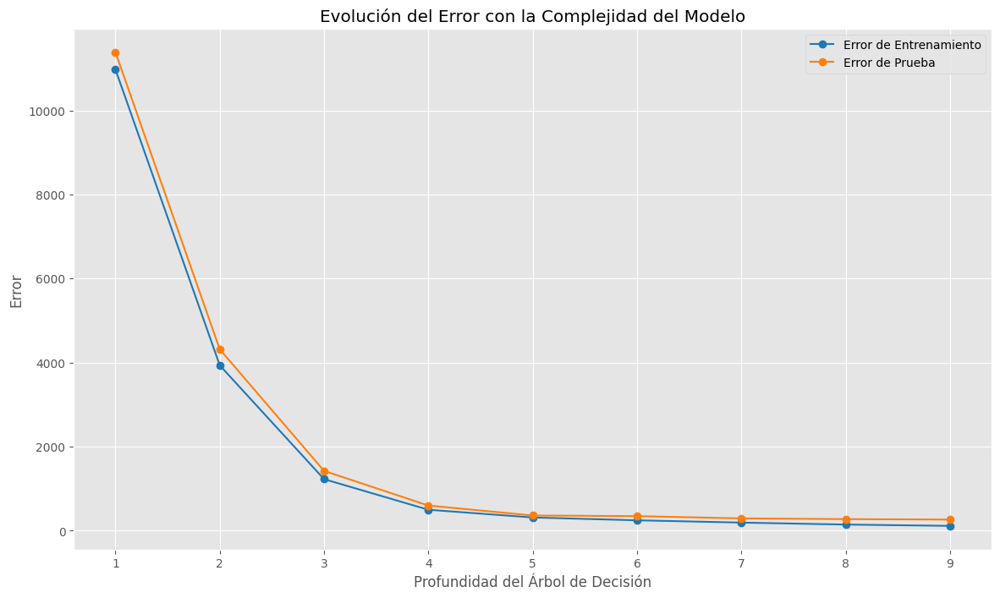

In [ ]:
# Definir las características
X = pd.concat([df_encoded['PCA_1'], df_encoded['PCA_2'], df_encoded['carrier_encoded'], df_encoded['airport_encoded'], df_encoded['year'], df_encoded['month']], axis=1)
y = df_encoded['arr_del15']

# Imputar valores faltantes en X
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Dividir los datos en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)

# Rango de complejidades (profundidades del árbol de decisión)
complexities = range(1, 10)

# Listas para almacenar los errores de entrenamiento y prueba
train_errors = []
test_errors = []

# Calcular errores para diferentes complejidades del modelo
for max_depth in complexities:
    # Crear y ajustar el modelo de árbol de decisión con la profundidad especificada
    modelo = DecisionTreeRegressor(max_depth=max_depth, random_state=42)
    modelo.fit(X_train, y_train)

    # Predicciones en el conjunto de entrenamiento y prueba
    y_train_pred = modelo.predict(X_train)
    y_test_pred = modelo.predict(X_test)

    # Calcular los errores de entrenamiento y prueba
    train_error = mean_squared_error(y_train, y_train_pred)
    test_error = mean_squared_error(y_test, y_test_pred)

    # Almacenar los errores
    train_errors.append(train_error)
    test_errors.append(test_error)

# Graficar la evolución de los errores de entrenamiento y prueba
plt.figure(figsize=(14, 8))
plt.plot(complexities, train_errors, label='Error de Entrenamiento', marker='o', color='tab:blue')
plt.plot(complexities, test_errors, label='Error de Prueba', marker='o', color='tab:orange')
plt.xlabel('Profundidad del Árbol de Decisión')
plt.ylabel('Error')
plt.title('Evolución del Error con la Complejidad del Modelo')
plt.legend()
plt.grid(True)
plt.show()

Se considera el mejor rendimiento puede encontrarse entre el rango 5 y el 9.

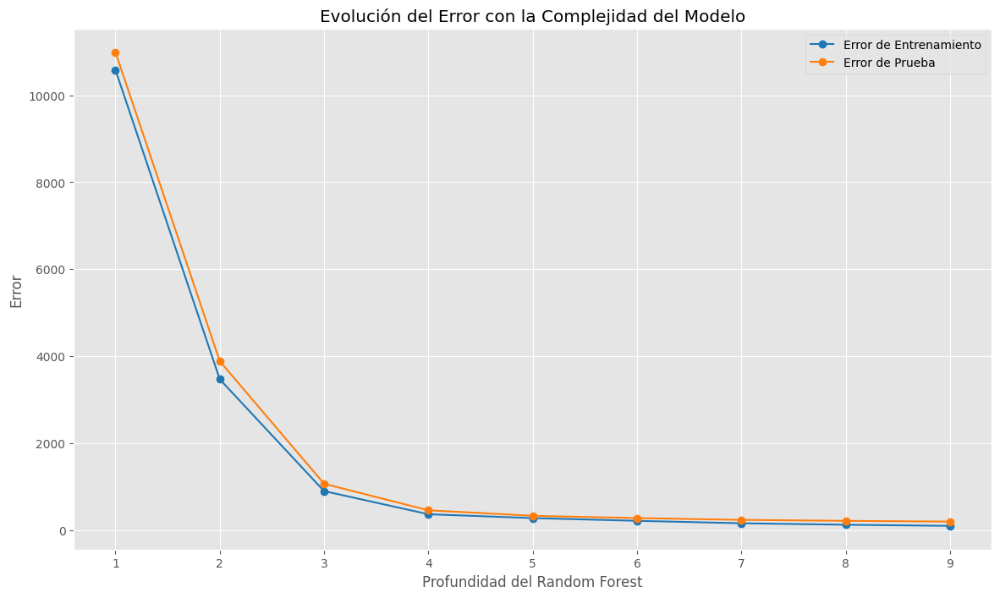

In [ ]:
# Definir las características
X = pd.concat([df_encoded['PCA_1'], df_encoded['PCA_2'], df_encoded['carrier_encoded'], df_encoded['airport_encoded'], df_encoded['year'], df_encoded['month']], axis=1)
y = df_encoded['arr_del15']

# Imputar valores faltantes en X
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Dividir los datos en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)

# Rango de complejidades (profundidades del árbol de decisión)
complexities = range(1, 10)

# Listas para almacenar los errores de entrenamiento y prueba
train_errors = []
test_errors = []

# Calcular errores para diferentes complejidades del modelo
for max_depth in complexities:
    # Crear y ajustar el modelo de árbol de decisión con la profundidad especificada
    modelo = RandomForestRegressor(max_depth=max_depth, random_state=42, n_estimators=100)
    modelo.fit(X_train, y_train)

    # Predicciones en el conjunto de entrenamiento y prueba
    y_train_pred = modelo.predict(X_train)
    y_test_pred = modelo.predict(X_test)

    # Calcular los errores de entrenamiento y prueba
    train_error = mean_squared_error(y_train, y_train_pred)
    test_error = mean_squared_error(y_test, y_test_pred)

    # Almacenar los errores
    train_errors.append(train_error)
    test_errors.append(test_error)

# Graficar la evolución de los errores de entrenamiento y prueba
plt.figure(figsize=(14, 8))
plt.plot(complexities, train_errors, label='Error de Entrenamiento', marker='o', color='tab:blue')
plt.plot(complexities, test_errors, label='Error de Prueba', marker='o', color='tab:orange')
plt.xlabel('Profundidad del Random Forest')
plt.ylabel('Error')
plt.title('Evolución del Error con la Complejidad del Modelo')
plt.legend()
plt.grid(True)
plt.show()

Se toma que la diferencia de error es muy baja a partir del 5 (que es el punto con menor diferencia), y como no hay grandes diferencias de rendimiento luego de eso, cualquier punto a partir del 5 presenta buen rendimiento.

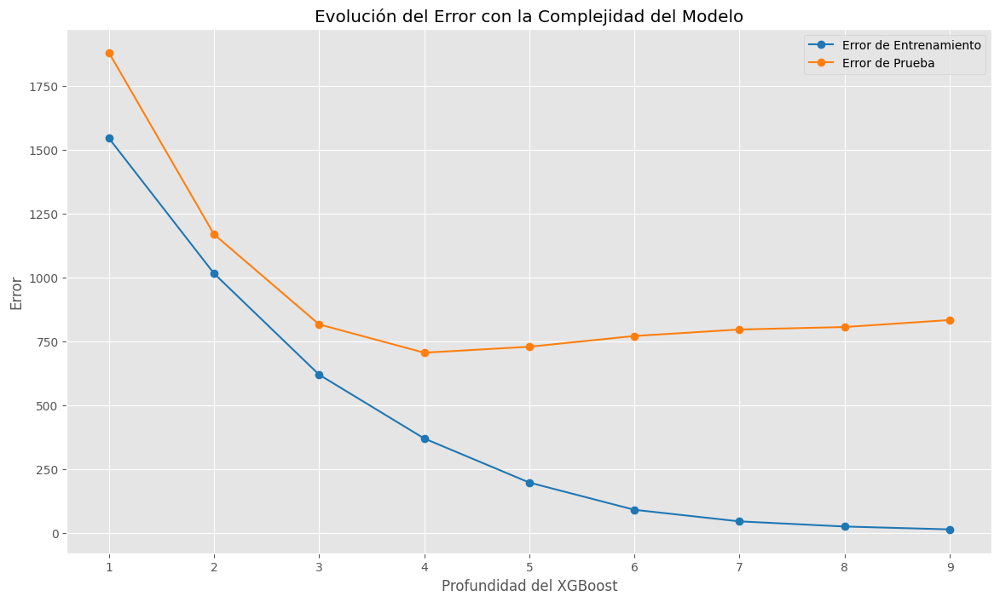

In [ ]:
# Definir las características
X = pd.concat([df_encoded['PCA_1'], df_encoded['PCA_2'], df_encoded['carrier_encoded'], df_encoded['airport_encoded'], df_encoded['year'], df_encoded['month']], axis=1)
y = df_encoded['arr_del15']

# Imputar valores faltantes en X
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Dividir los datos en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)

# Rango de complejidades (profundidades del árbol de decisión)
complexities = range(1, 10)

# Listas para almacenar los errores de entrenamiento y prueba
train_errors = []
test_errors = []

# Calcular errores para diferentes complejidades del modelo
for max_depth in complexities:
    # Crear y ajustar el modelo de árbol de decisión con la profundidad especificada
    modelo = XGBRegressor(max_depth=max_depth, random_state=42, n_estimators=100)
    modelo.fit(X_train, y_train)

    # Predicciones en el conjunto de entrenamiento y prueba
    y_train_pred = modelo.predict(X_train)
    y_test_pred = modelo.predict(X_test)

    # Calcular los errores de entrenamiento y prueba
    train_error = mean_squared_error(y_train, y_train_pred)
    test_error = mean_squared_error(y_test, y_test_pred)

    # Almacenar los errores
    train_errors.append(train_error)
    test_errors.append(test_error)

# Graficar la evolución de los errores de entrenamiento y prueba
plt.figure(figsize=(14, 8))
plt.plot(complexities, train_errors, label='Error de Entrenamiento', marker='o', color='tab:blue')
plt.plot(complexities, test_errors, label='Error de Prueba', marker='o', color='tab:orange')
plt.xlabel('Profundidad del XGBoost')
plt.ylabel('Error')
plt.title('Evolución del Error con la Complejidad del Modelo')
plt.legend()
plt.grid(True)
plt.show()

A diferencia de los análisis anteriores, se observa que luego del rango 3 empieza a resaltar una diferencia entre error de entrenamiento y prueba más alto. Debe tenerse en cuenta, sin embargo, que si bien en este caso se observa esa alteración de acuerdo con el cambio en este parámetro, a la hora de realizar el análisis hay otros parámetros que también pueden influenciar el resultado obtenido..

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 799
[LightGBM] [Info] Number of data points in the train set: 119998, number of used features: 6
[LightGBM] [Info] Start training from score 66.544059
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012716 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 799
[LightGBM] [Info] Number of data points in the train set: 119998, number of used features: 6
[LightGBM] [Info] Start training from score 66.544059
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 799
[LightGBM] [Info] Number of data points in the train set: 119998, number of used features: 6
[LightGBM] [Info] Start trai

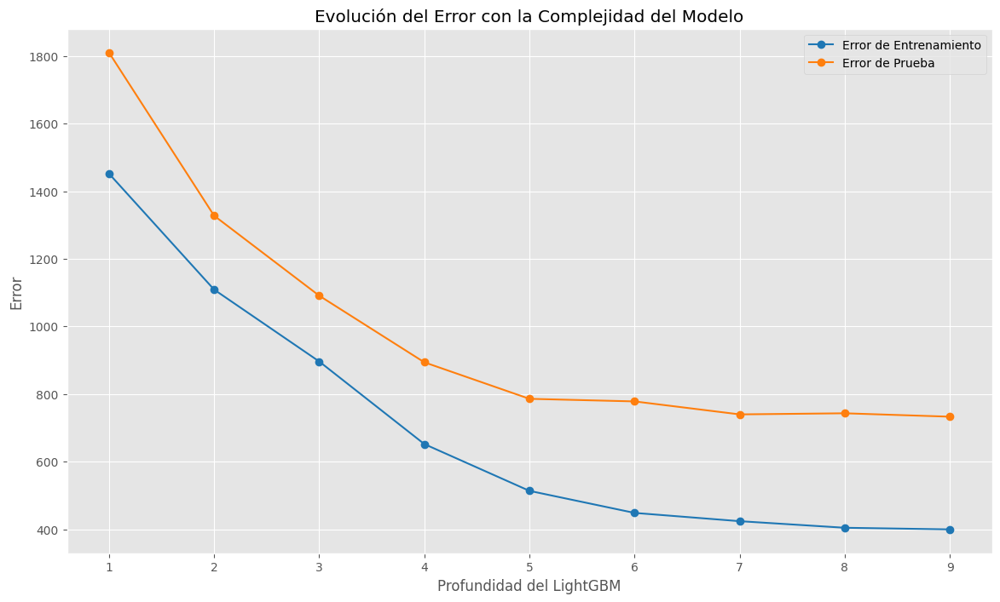

In [ ]:
# Definir las características
X = pd.concat([df_encoded['PCA_1'], df_encoded['PCA_2'], df_encoded['carrier_encoded'], df_encoded['airport_encoded'], df_encoded['year'], df_encoded['month']], axis=1)
y = df_encoded['arr_del15']

# Imputar valores faltantes en X
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Dividir los datos en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)

# Rango de complejidades (profundidades del árbol de decisión)
complexities = range(1, 10)

# Listas para almacenar los errores de entrenamiento y prueba
train_errors = []
test_errors = []

# Calcular errores para diferentes complejidades del modelo
for max_depth in complexities:
    # Crear y ajustar el modelo de árbol de decisión con la profundidad especificada
    modelo = LGBMRegressor(max_depth=max_depth, random_state=42, n_estimators=100, num_leaves=20)
    modelo.fit(X_train, y_train)

    # Predicciones en el conjunto de entrenamiento y prueba
    y_train_pred = modelo.predict(X_train)
    y_test_pred = modelo.predict(X_test)

    # Calcular los errores de entrenamiento y prueba
    train_error = mean_squared_error(y_train, y_train_pred)
    test_error = mean_squared_error(y_test, y_test_pred)

    # Almacenar los errores
    train_errors.append(train_error)
    test_errors.append(test_error)

# Graficar la evolución de los errores de entrenamiento y prueba
plt.figure(figsize=(14, 8))
plt.plot(complexities, train_errors, label='Error de Entrenamiento', marker='o', color='tab:blue')
plt.plot(complexities, test_errors, label='Error de Prueba', marker='o', color='tab:orange')
plt.xlabel('Profundidad del LightGBM')
plt.ylabel('Error')
plt.title('Evolución del Error con la Complejidad del Modelo')
plt.legend()
plt.grid(True)
plt.show()

Para LightGBM, se observa que el rendimiento con menor diferencia, es con una profundidad de 3, pero se consideran puntos tolerables los posteriores, ya que luego de la profundidad 5 tiende a estancarse la relación entre los errores entre los datos de entrenamiento y prueba, aunque continúa mejorando el rendimiento.

##### Crossvalidation y random search
Adicionando al análisis de relación entre error y bias, se realizó un análisis de crossvalidation, utilizando Stratified K Fold, y combinándolo con random search, con el fin de determinar los mejores parámetros para cada modelo, y analizar el rendimiento obtenido en el proceso de crossvalidation con las mismas, para después probar implementarlas a los distintos modelos. Se utilizó en todos los modelos con excepción de la regresión lineal, ya que este modelo no tiene muchos hiperparámetros a ajustar para refinar el modelo.

In [ ]:
# Preparación de los datos
X = pd.concat([df_encoded['PCA_1'], df_encoded['PCA_2'], df_encoded['carrier_encoded'],
               df_encoded['airport_encoded'], df_encoded['year'], df_encoded['month']], axis=1)
y = df_encoded['arr_del15']

# Imputación de valores faltantes
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Configuración de StratifiedKFold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Definición de los hiperparámetros a buscar
param_distributions = {
    'Decision Tree': {
        'max_depth': randint(3, 10),
        'min_samples_split': randint(2, 10),
        'min_samples_leaf': randint(1, 10)
    },
    'Random Forest': {
        'n_estimators': randint(10, 100),
        'max_depth': randint(3, 10),
        'min_samples_split': randint(2, 10),
        'min_samples_leaf': randint(1, 10)
    },
    'XGBoost': {
        'n_estimators': randint(50, 100),
        'max_depth': randint(3, 10),
        'learning_rate': uniform(0.01, 0.3),
        'subsample': uniform(0.7, 1.0)
    },
    'LightGBM': {
        'n_estimators': randint(50, 100),
        'max_depth': randint(3, 10),
        'learning_rate': uniform(0.01, 0.3),
        'num_leaves': randint(20, 50)
    }
}

# Definición de los modelos
modelos = {
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42),
    'XGBoost': XGBRegressor(random_state=42, use_label_encoder=False, eval_metric='mae'),
    'LightGBM': LGBMRegressor(random_state=42)
}

# Evaluación de los modelos
resultados = []

for nombre_modelo, modelo in modelos.items():
    print(f'Evaluando {nombre_modelo}...')
    random_search = RandomizedSearchCV(modelo, param_distributions[nombre_modelo],
                                       n_iter=20, scoring='neg_mean_absolute_error',
                                       n_jobs=-1, cv=skf, random_state=42, verbose=1)
    random_search.fit(X_imputed, y)

    mejor_modelo = random_search.best_estimator_
    mejores_params = random_search.best_params_

    # Realizar predicciones con el mejor modelo
    predicciones = mejor_modelo.predict(X_imputed)

    # Calcular métricas
    mae = mean_absolute_error(y, predicciones)
    mse = mean_squared_error(y, predicciones)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y, predicciones)
    r2 = r2_score(y, predicciones)

    # Guardar resultados
    resultados.append({
        'Modelo': nombre_modelo,
        'Mejores Parámetros': mejores_params,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'MAPE': mape,
        'R²': r2
    })

# Crear un DataFrame con los resultados
df_resultados_cross = pd.DataFrame(resultados)

# Mostrar los resultados
print(df_resultados_cross)


Evaluando Decision Tree...
Fitting 5 folds for each of 20 candidates, totalling 100 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


Evaluando Random Forest...
Fitting 5 folds for each of 20 candidates, totalling 100 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


Evaluando XGBoost...
Fitting 5 folds for each of 20 candidates, totalling 100 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
60 fits failed out of a total of 100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/xgboost/core.py", line 730, in inner_f
    return func(**kwargs)
  File "/usr

Evaluando LightGBM...
Fitting 5 folds for each of 20 candidates, totalling 100 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 798
[LightGBM] [Info] Number of data points in the train set: 171426, number of used features: 6
[LightGBM] [Info] Start training from score 66.355716
          Modelo  \
0  Decision Tree   
1  Random Forest   
2        XGBoost   
3       LightGBM   

                                                                                          Mejores Parámetros  \
0                                            {'max_depth': 9, 'min_samples_leaf': 4, 'min_samples_split': 6}   
1                        {'max_depth': 9, 'min_samples_leaf': 3, 'min_samples_split': 7, 'n_estimators': 90}   
2  {'learning_rate': 0.189597545259111, 'max_depth': 9, 'n_estimators': 68, 'subsample': 0.7999749158180028}   
3               {'learning_rate': 0.30212665565243774, 'max_depth': 9, 'n_estimators': 96, 'num_leaves': 49} 

In [ ]:
df_resultados_cross

,Modelo,Mejores Parámetros,MAE,MSE,RMSE,MAPE,R²
0,Decision Tree,"{'max_depth': 9, 'min_samples_leaf': 4, 'min_samples_split': 6}",4.278714,135.933703,11.659061,1.102057e-01,0.995779
1,Random Forest,"{'max_depth': 9, 'min_samples_leaf': 3, 'min_samples_split': 7, 'n_estimators': 90}",4.009972,113.212771,10.640149,1.065287e-01,0.996484
2,XGBoost,"{'learning_rate': 0.189597545259111, 'max_depth': 9, 'n_estimators': 68, 'subsample': 0.7999749158180028}",2.913429,51.122555,7.150004,2.522816e+13,0.998412
3,LightGBM,"{'learning_rate': 0.30212665565243774, 'max_depth': 9, 'n_estimators': 96, 'num_leaves': 49}",3.742574,187.439829,13.690867,4.051321e+13,0.994179


Estos datos son los que generan el mejor fit utilizando todos los datos analizados en el proceso de crossvalidation. Sin embargo, si bien no se ajustaron todos los parámetros posibles, debe tenerse cuidado al utilizarlos ya que pueden generar overfitting del modelo a los datos.

De cualquier manera, el hecho de que no se hayan utilizado todos los parámetros, y que los datos hayan surgido del proceso de crossvalidation utilizando un proceso de Stratified K Fold, hace que no haya un overfitting total, ya que en todo momento se utilizaron solo el 80% de los datos (al haber un split de 5), por lo que habría margen para refinarlo si se quisiera, y podrían haber casos donde el rendimiento sea inferior.

Con estos cambios y procesos realizados, se optó por volver a probar la eficiencia de los modelos seleccionados

#### Primera ronda de análisis - Ejecución

En esta sección volverá a ejecutarse el análisis con las modificaciones realizadas. Para aquellos modelos en que se realizó el proceso de crossvalidation, se ejecutará el modelo dos veces, utilizando en la primera ejecución los parámetros iniciales con las nuevas variables, y ajustando en base a los mejores parámetros obtenidos en el proceso de crossvalidation para la segunda ejecución.

##### Regresión lineal

In [ ]:
# Combinar las componentes principales con las variables codificadas
X_combined = pd.concat([df_encoded['PCA_1'], df_encoded['PCA_2'], df_encoded['carrier_encoded'], df_encoded['airport_encoded'], df_encoded['year'], df_encoded['month']], axis=1)

# Definir la variable objetivo
y = df_encoded['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.3, random_state=42)

# Entrenar el modelo de regresión lineal
modelo_regresion_lineal = LinearRegression()
modelo_regresion_lineal.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_regresion_lineal.predict(X_test)

# Evaluar el modelo
mae_rl2 = mean_absolute_error(y_test, predicciones)
mse_rl2 = mean_squared_error(y_test, predicciones)
rmse_rl2 = mean_squared_error(y_test, predicciones, squared=False)
mape_rl2 = mean_absolute_percentage_error(y_test, predicciones)
r2_rl2 = r2_score(y_test, predicciones)

print("MAE:", mae_rl2)
print("MSE:", mse_rl2)
print("RMSE:", rmse_rl2)
print("MAPE", mape_rl2)
print("R²:", r2_rl2)

MAE: 6.176033784863378
MSE: 358.0399425962002
RMSE: 18.921943414887387
MAPE 450890361608952.2
R²: 0.9888795588241526


En base a esto, en lo que respecta a las métricas obtenidas de las regresiones lineales previamente realizadas, puede observarse un rendimiento un poco inferior del modelo, pero con la gran ventaja de que se analiza ahora la totalidad de los datos, realizándose el proceso más rápidamente e incorporando incluso datos nuevos, por lo que resulta más preciso el verdadero rendimiento del modelo.

En comparación con el mejor modelo de regresión lineal anterior, se observa que aumentaron los valores de las métricas, lo que implica un aumento de los errores promedios, y disminuyó el R² ligeramente.

Métricas del mejor modelo anterior:
* MAE: 1.5525002834959833
* MSE: 19.74829353434921
* RMSE: 4.443905212124715
* MAPE 29976092143548.31
* R²: 0.9993631718788198

Métricas del nuevo modelo:
* MAE: 6.176033784863376
* MSE: 358.0399425961999
* RMSE: 18.92194341488738
* MAPE 450890361608956.94
* R²: 0.9888795588241526

##### Árboles de decisión

In [ ]:
X_combined = pd.concat([df_encoded['PCA_1'], df_encoded['PCA_2'], df_encoded['carrier_encoded'], df_encoded['airport_encoded'], df_encoded['year'], df_encoded['month']], axis=1)
y = df_encoded['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de árbol de decisión para regresión
modelo_arbol = DecisionTreeRegressor(random_state=42, max_depth=5)
modelo_arbol.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_arbol.predict(X_test)

# Evaluar el modelo
mae_adr2 = mean_absolute_error(y_test, predicciones)
mse_adr2 = mean_squared_error(y_test, predicciones)
rmse_adr2 = mean_squared_error(y_test, predicciones, squared=False)
mape_adr2 = mean_absolute_percentage_error(y_test, predicciones)
r2_adr2 = r2_score(y_test, predicciones)

print("MAE:", mae_adr2)
print("MSE:", mse_adr2)
print("RMSE:", rmse_adr2)
print("MAPE:", mape_adr2)
print("R²:", r2_adr2)

MAE: 7.026927335775493
MSE: 361.4102350670015
RMSE: 19.01079259439231
MAPE: 647861919771111.0
R²: 0.9887748801704381


In [ ]:
X_combined = pd.concat([df_encoded['PCA_1'], df_encoded['PCA_2'], df_encoded['carrier_encoded'], df_encoded['airport_encoded'], df_encoded['year'], df_encoded['month']], axis=1)
y = df_encoded['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de árbol de decisión para regresión
modelo_arbol = DecisionTreeRegressor(random_state=42, max_depth=9, min_samples_leaf=4, min_samples_split=6)
modelo_arbol.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_arbol.predict(X_test)

# Evaluar el modelo
mae_adr3 = mean_absolute_error(y_test, predicciones)
mse_adr3 = mean_squared_error(y_test, predicciones)
rmse_adr3 = mean_squared_error(y_test, predicciones, squared=False)
mape_adr3 = mean_absolute_percentage_error(y_test, predicciones)
r2_adr3 = r2_score(y_test, predicciones)

print("MAE:", mae_adr3)
print("MSE:", mse_adr3)
print("RMSE:", rmse_adr3)
print("MAPE:", mape_adr3)
print("R²:", r2_adr3)

MAE: 4.783984743392565
MSE: 241.06663791789327
RMSE: 15.526320810735983
MAPE: 0.11191029487572361
R²: 0.9925126583727318


En este caso, con el modelo sin los parámetros refinados, en contraste con los árboles de decisión realizados anteriormente, se observa un rendimiento bastante superior en todas las métricas, con excepción del MAPE.

Sin embargo, respecto con la segunda ejecución del modelo, se observan mejoras sustanciales en todas las métricas.

Métricas del mejor modelo anterior:
* MAE: 12.018785425818006
* MSE: 1153.4779164662234
* RMSE: 33.962890284341576
* MAPE 695039611437469.8
* R²: 0.9641738761751275

Métricas del nuevo modelo:
* MAE: 7.026927335775493
* MSE: 361.4102350670015
* RMSE: 19.01079259439231
* MAPE: 647861919771111.0
* R²: 0.9887748801704381

Métricas del nuevo modelo con parámetros de crossvalidation:
* MAE: 4.783984743392565
* MSE: 241.06663791789327
* RMSE: 15.526320810735983
* MAPE: 0.11191029487572361
* R²: 0.9925126583727318

##### Random Forest

In [ ]:
X_combined = pd.concat([df_encoded['PCA_1'], df_encoded['PCA_2'], df_encoded['carrier_encoded'], df_encoded['airport_encoded'], df_encoded['year'], df_encoded['month']], axis=1)
y = df_encoded['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de Random Forest Regressor
modelo_rf = RandomForestRegressor(n_estimators=100, max_depth=5, random_state=42)
modelo_rf.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_rf.predict(X_test)

# Evaluar el modelo
mae_rf2 = mean_absolute_error(y_test, predicciones)
mse_rf2 = mean_squared_error(y_test, predicciones)
rmse_rf2 = mean_squared_error(y_test, predicciones, squared=False)
mape_rf2 = mean_absolute_percentage_error(y_test, predicciones)
r2_rf2 = r2_score(y_test, predicciones)

print("MAE:", mae_rf2)
print("MSE:", mse_rf2)
print("RMSE:", rmse_rf2)
print("MAPE:", mape_rf2)
print("R²:", r2_rf2)

MAE: 6.396582311588653
MSE: 326.0408441724321
RMSE: 18.056601124586876
MAPE: 647764363011514.4
R²: 0.9898734258467015


In [ ]:
X_combined = pd.concat([df_encoded['PCA_1'], df_encoded['PCA_2'], df_encoded['carrier_encoded'], df_encoded['airport_encoded'], df_encoded['year'], df_encoded['month']], axis=1)
y = df_encoded['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de Random Forest Regressor
modelo_rf = RandomForestRegressor(max_depth=9, min_samples_leaf=3, min_samples_split=7, n_estimators=90, random_state=42)
modelo_rf.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_rf.predict(X_test)

# Evaluar el modelo
mae_rf3 = mean_absolute_error(y_test, predicciones)
mse_rf3 = mean_squared_error(y_test, predicciones)
rmse_rf3 = mean_squared_error(y_test, predicciones, squared=False)
mape_rf3 = mean_absolute_percentage_error(y_test, predicciones)
r2_rf3 = r2_score(y_test, predicciones)

print("MAE:", mae_rf3)
print("MSE:", mse_rf3)
print("RMSE:", rmse_rf3)
print("MAPE:", mape_rf3)
print("R²:", r2_rf3)

MAE: 4.415048302326371
MSE: 194.15736110630536
RMSE: 13.93403606663573
MAPE: 0.10762432904398125
R²: 0.9939696238989864


En este caso, en la primera versión, al igual que con los árboles de decisión, puede observarse una mejora respecto a las métricas del modelo anterior. De la misma manera, respecto a las métricas del modelo con parámetros de crossvalidation, puede observarse que mejoran todas las métricas.

Métricas del mejor modelo anterior
* MAE: 9.279549884865432
* MSE: 637.0813973841588
* RMSE: 25.240471417629244
* MAPE: 667108908043996.2
* R²: 0.9812323539730101

Métricas del nuevo modelo:
* MAE: 6.396582311588653
* MSE: 326.0408441724321
* RMSE: 18.056601124586876
* MAPE: 647764363011514.4
* R²: 0.9898734258467015

Métricas del nuevo modelo con parámetros de crossvalidation:
* MAE: 4.415048302326371
* MSE: 194.15736110630536
* RMSE: 13.93403606663573
* MAPE: 0.10762432904398125
* R²: 0.9939696238989864

Puede observarse que, hasta ahora, en líneas generales, aplicando estos cambios se produjo un rendimiento relativamente similar o, en algunos casos, incluso mejor en los distintos modelos aplicados, incorporando nuevos elementos al análisis encodeados, realizando el feature engineering y tomando la totalidad de los datos en lugar de una muestra.

##### XGBoost

In [ ]:
# Combinar las componentes principales con las variables codificadas
X_combined = pd.concat([df_encoded['PCA_1'], df_encoded['PCA_2'], df_encoded['carrier_encoded'], df_encoded['airport_encoded'], df_encoded['year'], df_encoded['month']], axis=1)

# Definir la variable objetivo
y = df_encoded['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de XGBoost Regressor
modelo_xgb = XGBRegressor(n_estimators=100, max_depth=5, random_state=42)
modelo_xgb.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_xgb.predict(X_test)

# Evaluar el modelo
mae_xgb1 = mean_absolute_error(y_test, predicciones)
mse_xgb1 = mean_squared_error(y_test, predicciones)
rmse_xgb1 = mean_squared_error(y_test, predicciones, squared=False)
mape_xgb1 = mean_absolute_percentage_error(y_test, predicciones)
r2_xgb1 = r2_score(y_test, predicciones)

print("MAE:", mae_xgb1)
print("MSE:", mse_xgb1)
print("RMSE:", rmse_xgb1)
print("MAPE:", mape_xgb1)
print("R²:", r2_xgb1)


MAE: 4.836328114780457
MSE: 727.8959513532116
RMSE: 26.97954690785617
MAPE: 65023423481566.69
R²: 0.9773921198554935


In [ ]:
# Combinar las componentes principales con las variables codificadas
X_combined = pd.concat([df_encoded['PCA_1'], df_encoded['PCA_2'], df_encoded['carrier_encoded'], df_encoded['airport_encoded'], df_encoded['year'], df_encoded['month']], axis=1)

# Definir la variable objetivo
y = df_encoded['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de XGBoost Regressor
modelo_xgb = XGBRegressor(random_state=42, learning_rate=0.189597545259111, max_depth=9, n_estimators=68, subsample=0.7999749158180028)
modelo_xgb.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_xgb.predict(X_test)

# Evaluar el modelo
mae_xgb2 = mean_absolute_error(y_test, predicciones)
mse_xgb2 = mean_squared_error(y_test, predicciones)
rmse_xgb2 = mean_squared_error(y_test, predicciones, squared=False)
mape_xgb2 = mean_absolute_percentage_error(y_test, predicciones)
r2_xgb2 = r2_score(y_test, predicciones)

print("MAE:", mae_xgb2)
print("MSE:", mse_xgb2)
print("RMSE:", rmse_xgb2)
print("MAPE:", mape_xgb2)
print("R²:", r2_xgb2)

MAE: 4.5917910235114485
MSE: 826.5228666552102
RMSE: 28.749310716175618
MAPE: 24720751010902.676
R²: 0.9743288448420458


En este caso, si bien el modelo es generado en forma más rápida y eficiente que un Random Forest normal, puede observarse un rendimiento superior por parte del Random Forest, por lo que este primer modelo resulta superior.

Por otra parte, se observa que las métricas del proceso de crossvalidation muestran resultados mixtos, pudiéndose observar mejor rendimiento del primer modelo en MSE, RMSE y R², y mejor rendimiento del segundo en MAE y MAPE. Esto se puede explicar por el orígen de los datos (al venir del Stratified K Fold), y al haber otros parámetros no modificados.

De cualquier manera, se considera que ambos modelos son muy eficientes para predecir la variable objetivo.

Métricas modelo 2 Random Forest:
* MAE: 6.5838836537785355
* MSE: 312.1857744926542
* RMSE: 17.668779654878666
* MAPE: 987065003635451.6
* R²: 0.9896961028144775

Métricas del modelo 3 Random Forest:
* MAE: 4.415048302326371
* MSE: 194.15736110630536
* RMSE: 47.321946948197876
* MAPE: 0.10762432904398125
* R²: 0.9939696238989864

Métricas de XGBoost 1:
* MAE: 4.836328114780457
* MSE: 727.8959513532116
* RMSE: 26.97954690785617
* MAPE: 65023423481566.69
* R²: 0.9773921198554935

Métricas de XGBoost 2
* MAE: 4.5917910235114485
* MSE: 826.5228666552102
* RMSE: 28.749310716175618
* MAPE: 24720751010902.676
* R²: 0.9743288448420458

##### LightGBM

In [ ]:
# Combinar las componentes principales con las variables codificadas
X_combined = pd.concat([df_encoded['PCA_1'], df_encoded['PCA_2'], df_encoded['carrier_encoded'], df_encoded['airport_encoded'], df_encoded['year'], df_encoded['month']], axis=1)

# Definir la variable objetivo
y = df_encoded['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de LightGBM Regressor
modelo_lgbm = LGBMRegressor(n_estimators=100, max_depth=5, num_leaves=20, random_state=42)
modelo_lgbm.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_lgbm.predict(X_test)

# Evaluar el modelo
mae_lgbm1 = mean_absolute_error(y_test, predicciones)
mse_lgbm1 = mean_squared_error(y_test, predicciones)
rmse_lgbm1 = mean_squared_error(y_test, predicciones, squared=False)
mape_lgbm1 = mean_absolute_percentage_error(y_test, predicciones)
r2_lgbm1 = r2_score(y_test, predicciones)

print("MAE:", mae_lgbm1)
print("MSE:", mse_lgbm1)
print("RMSE:", rmse_lgbm1)
print("MAPE:", mape_lgbm1)
print("R²:", r2_lgbm1)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 799
[LightGBM] [Info] Number of data points in the train set: 119998, number of used features: 6
[LightGBM] [Info] Start training from score 66.544059
MAE: 5.075912114380039
MSE: 785.763639659028
RMSE: 28.031475873721455
MAPE: 112977441731243.95
R²: 0.9755947946209934


In [ ]:
# Combinar las componentes principales con las variables codificadas
X_combined = pd.concat([df_encoded['PCA_1'], df_encoded['PCA_2'], df_encoded['carrier_encoded'], df_encoded['airport_encoded'], df_encoded['year'], df_encoded['month']], axis=1)

# Definir la variable objetivo
y = df_encoded['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de LightGBM Regressor
modelo_lgbm = LGBMRegressor(random_state=42, learning_rate=0.30212665565243774, max_depth=9, n_estimators=96, num_leaves=49)
modelo_lgbm.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_lgbm.predict(X_test)

# Evaluar el modelo
mae_lgbm2 = mean_absolute_error(y_test, predicciones)
mse_lgbm2 = mean_squared_error(y_test, predicciones)
rmse_lgbm2 = mean_squared_error(y_test, predicciones, squared=False)
mape_lgbm2 = mean_absolute_percentage_error(y_test, predicciones)
r2_lgbm2 = r2_score(y_test, predicciones)

print("MAE:", mae_lgbm2)
print("MSE:", mse_lgbm2)
print("RMSE:", rmse_lgbm2)
print("MAPE:", mape_lgbm2)
print("R²:", r2_lgbm2)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 799
[LightGBM] [Info] Number of data points in the train set: 119998, number of used features: 6
[LightGBM] [Info] Start training from score 66.544059
MAE: 4.792188821316534
MSE: 876.0806649782411
RMSE: 29.598659851051384
MAPE: 41377887174601.125
R²: 0.9727896183047505


En este caso, al igual que en el modelo de XGBoost, puede observarse un rendimiento superior por parte del modelo de Random Forest, aunque este es mucho más rápido y eficiente en cuanto a su análisis y generación. Por otra parte, este modelo resulta también ligeramente menos eficaz para la predicción de los valores de arr_del15 que el de XGBoost.

Además, al igual que en XGBoost, el rendimiento del modelo con parámetros refinados arroja resultados mixtos, teniendo mejores valores el primer modelo en las métricas del MSE, RMSE y R², y teniendo el segundo modelo mejores valores en el MAE y MAPE. Esto se puede explicar por el orígen de los datos (al venir del Stratified K Fold), y al haber otros parámetros no modificados.

Al igual que con XGBoost, este modelo continúa también siendo bastante eficiente para cumplir con la predicción de la variable objetivo.

Métricas modelo 2 Random Forest:
* MAE: 6.5838836537785355
* MSE: 312.1857744926542
* RMSE: 17.668779654878666
* MAPE: 987065003635451.6
* R²: 0.9896961028144775

Métricas del modelo 3 Random Forest:
* MAE: 4.415048302326371
* MSE: 194.15736110630536
* RMSE: 47.321946948197876
* MAPE: 0.10762432904398125
* R²: 0.9939696238989864

Métricas de LightGBM 1:
* MAE: 5.075912114380039
* MSE: 785.763639659028
* RMSE: 28.031475873721455
* MAPE: 112977441731243.95
* R²: 0.9755947946209934

Métricas de LightGBM 2:
* MAE: 4.792188821316534
* MSE: 876.0806649782411
* RMSE: 29.598659851051384
* MAPE: 41377887174601.125
* R²: 0.9727896183047505

#####Agrupación de resultados

In [ ]:
def evaluar_modelos(X_train, X_test, y_train, y_test, modelos):
    resultados = []

    for nombre_modelo, modelo in modelos.items():
        # Entrenar el modelo
        modelo.fit(X_train, y_train)

        # Realizar predicciones
        predicciones = modelo.predict(X_test)

        # Calcular métricas
        mae = mean_absolute_error(y_test, predicciones)
        mse = mean_squared_error(y_test, predicciones)
        rmse = mean_squared_error(y_test, predicciones, squared=False)  # Para obtener el RMSE
        mape = mean_absolute_percentage_error(y_test, predicciones)
        r2 = r2_score(y_test, predicciones)

        # Guardar resultados
        resultados.append({
            'Modelo': nombre_modelo,
            'MAE': mae,
            'MSE': mse,
            'RMSE': rmse,
            'MAPE': mape,
            'R²': r2
        })

    # Crear un DataFrame con los resultados
    df_resultados = pd.DataFrame(resultados)

    return df_resultados

# Combinar las componentes principales con las variables codificadas
X_combined = pd.concat([df_encoded['PCA_1'], df_encoded['PCA_2'], df_encoded['carrier_encoded'],
                        df_encoded['airport_encoded'], df_encoded['year'], df_encoded['month']], axis=1)

# Definir la variable objetivo
y = df_encoded['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.3, random_state=42)

# Definir los modelos a evaluar
modelos = {
    'Linear Regression': LinearRegression(),
    'Decision Tree Regressor 1': DecisionTreeRegressor(random_state=42, max_depth=5),
    'Decision Tree Regressor 2': DecisionTreeRegressor(random_state=42, max_depth=9, min_samples_leaf=4, min_samples_split=6),
    'Random Forest 1': RandomForestRegressor(n_estimators=100, max_depth=5, random_state=42),
    'Random Forest 2': RandomForestRegressor(max_depth=9, min_samples_leaf=3, min_samples_split=7, n_estimators=90, random_state=42),
    'XGBoost 1': XGBRegressor(n_estimators=100, max_depth=5, random_state=42),
    'XGBoost 2': XGBRegressor(learning_rate=0.189597545259111, max_depth=9, n_estimators=68, subsample=0.7999749158180028, random_state=42),
    'LightGBM 1': LGBMRegressor(n_estimators=100, max_depth=5, num_leaves=20, random_state=42),
    'LightGBM 2': LGBMRegressor(learning_rate=0.30212665565243774, max_depth=9, n_estimators=96, num_leaves=49, random_state=42)
}

# Llamar a la función y obtener los resultados
df_resultados = evaluar_modelos(X_train, X_test, y_train, y_test, modelos)

# Mostrar los resultados
df_resultados

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 799
[LightGBM] [Info] Number of data points in the train set: 119998, number of used features: 6
[LightGBM] [Info] Start training from score 66.544059
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 799
[LightGBM] [Info] Number of data points in the train set: 119998, number of used features: 6
[LightGBM] [Info] Start training from score 66.544059


,Modelo,MAE,MSE,RMSE,MAPE,R²
0,Linear Regression,6.176034,358.039943,18.921943,4.508904e+14,0.988880
1,Decision Tree Regressor 1,7.026927,361.410235,19.010793,6.478619e+14,0.988775
2,Decision Tree Regressor 2,4.783985,241.066638,15.526321,1.119103e-01,0.992513
3,Random Forest 1,6.396582,326.040844,18.056601,6.477644e+14,0.989873
4,Random Forest 2,4.415048,194.157361,13.934036,1.076243e-01,0.993970
5,XGBoost 1,4.836328,727.895951,26.979547,6.502342e+13,0.977392
6,XGBoost 2,4.591791,826.522867,28.749311,2.472075e+13,0.974329
7,LightGBM 1,5.075912,785.763640,28.031476,1.129774e+14,0.975595
8,LightGBM 2,4.792189,876.080665,29.598660,4.137789e+13,0.972790


En base a los resultados obtenidos, puede observarse cómo los modelos con mejores métricas son random forest, en primer lugar, y árboles de decisión en segundo, ambos con los parámetros obtenidos del proceso de crossvalidation, aunque todos tienen muy buen rendimiento para predecir el valor de 'arr_del15'

#### Segunda ronda de análisis - Preparación
En adición al proceso de análisis anterior, se decide repetir el proceso, pero incorporando las variables 'arr_flights', 'weather_ct' y 'arr_diverted' para el feature engineering, al observarse que las mismas también tienen una correlación bastante visible con arr_del15, y repitiendo el resto del proceso en forma relativamente similar.

##### Encoding de variables
En base a esto, se vuelve a hacer el encoding para incorporar las variables de 'carrier' y 'airport' a esta nueva ronda de análisis.

In [ ]:
# Copiar el DataFrame original para no modificar los datos originales
df_encoded2 = df.copy()

# Inicializar los codificadores de etiquetas para carrier y airport
label_encoder_carrier = LabelEncoder()
label_encoder_airport = LabelEncoder()

# Aplicar el Label Encoding a las variables 'carrier' y 'airport'
df_encoded2['carrier_encoded'] = label_encoder_carrier.fit_transform(df['carrier'])
df_encoded2['airport_encoded'] = label_encoder_airport.fit_transform(df['airport'])

# Crear un diccionario que relacione los valores originales con los valores codificados
carrier_encoding_map = {label: value for label, value in zip(label_encoder_carrier.classes_, label_encoder_carrier.transform(label_encoder_carrier.classes_))}
airport_encoding_map = {label: value for label, value in zip(label_encoder_airport.classes_, label_encoder_airport.transform(label_encoder_airport.classes_))}

# Mostrar los primeros elementos del DataFrame codificado y el diccionario de mapeo
print("DataFrame codificado:")
print(df_encoded2[['carrier', 'carrier_encoded', 'airport', 'airport_encoded']].head())

print("\nDiccionario de mapeo para 'carrier':")
print(carrier_encoding_map)

print("\nDiccionario de mapeo para 'airport':")
print(airport_encoding_map)

DataFrame codificado:
  carrier  carrier_encoded airport  airport_encoded
0      9E                0     ABE                0
1      9E                0     ABY                4
2      9E                0     AEX               11
3      9E                0     AGS               12
4      9E                0     ALB               14

Diccionario de mapeo para 'carrier':
{'9E': 0, 'AA': 1, 'AS': 2, 'B6': 3, 'DL': 4, 'EV': 5, 'F9': 6, 'FL': 7, 'G4': 8, 'HA': 9, 'MQ': 10, 'NK': 11, 'OH': 12, 'OO': 13, 'QX': 14, 'UA': 15, 'US': 16, 'VX': 17, 'WN': 18, 'YV': 19, 'YX': 20}

Diccionario de mapeo para 'airport':
{'ABE': 0, 'ABI': 1, 'ABQ': 2, 'ABR': 3, 'ABY': 4, 'ACK': 5, 'ACT': 6, 'ACV': 7, 'ACY': 8, 'ADK': 9, 'ADQ': 10, 'AEX': 11, 'AGS': 12, 'AKN': 13, 'ALB': 14, 'ALO': 15, 'ALS': 16, 'ALW': 17, 'AMA': 18, 'ANC': 19, 'APN': 20, 'ART': 21, 'ASE': 22, 'ATL': 23, 'ATW': 24, 'ATY': 25, 'AUS': 26, 'AVL': 27, 'AVP': 28, 'AZA': 29, 'AZO': 30, 'BDL': 31, 'BET': 32, 'BFF': 33, 'BFL': 34, 'BFM': 35, 'B

##### Feature engineering
Se hace también el scaling con pca, donde esta vez se incorporaron las nuevas variables, y se decidió en esta ronda utilizar tres variables.

Por último, respecto a las variables incorporadas al análisis, y a los resultados a obtener, se considera que, debido a que algunas de estas variables no tienen una correlación tan clara con la variable objetivo, de acuerdo a lo visto en el pairplot y métricas obtenidas, y al estar incoporando estas variables nuevas al feature engineering, los distintos modelos pueden llegar a ser menos precisos que los anteriormente generados.

In [ ]:
# Estandarizar los datos
scaler = StandardScaler()
X_scaled2 = scaler.fit_transform(df_encoded2[['late_aircraft_delay', 'arr_delay', 'late_aircraft_ct', 'nas_ct', 'carrier_ct', 'arr_flights', 'weather_ct', 'arr_diverted']])

# Ajustar el modelo PCA
pca = PCA(n_components=3)  # Cambiar el número de componentes a 3
X_pca2 = pca.fit_transform(X_scaled2)

# Añadir las nuevas componentes principales al dataframe
df_encoded2['PCA_1'] = X_pca2[:, 0]
df_encoded2['PCA_2'] = X_pca2[:, 1]
df_encoded2['PCA_3'] = X_pca2[:, 2]

##### Relación error y bias

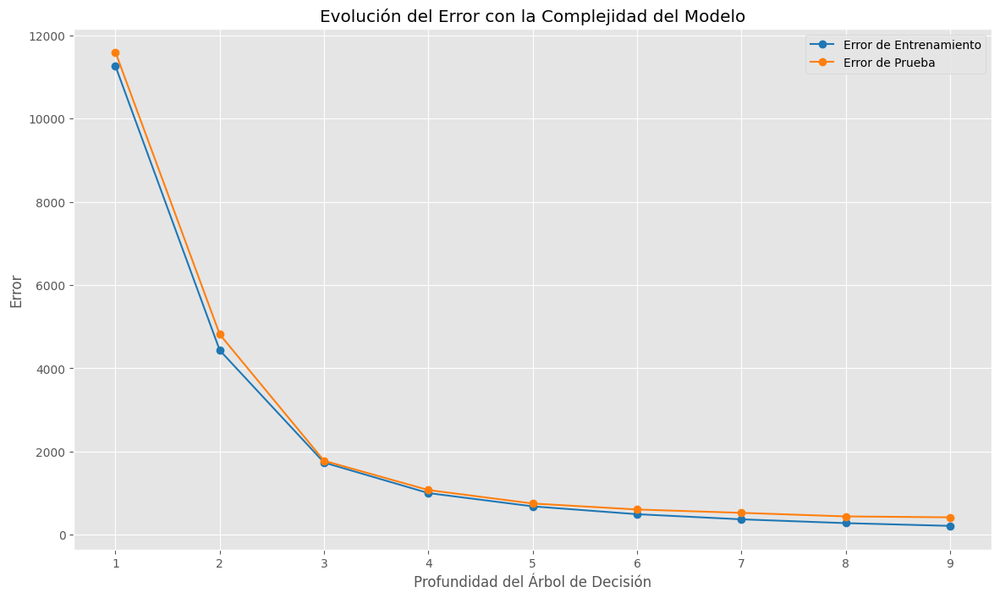

In [ ]:
# Definir las características
X = pd.concat([df_encoded2['PCA_1'], df_encoded2['PCA_2'], df_encoded2['PCA_3'], df_encoded2['carrier_encoded'], df_encoded2['airport_encoded'], df_encoded2['year'], df_encoded2['month']], axis=1)
y = df_encoded['arr_del15']

# Imputar valores faltantes en X
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X_combined_2)

# Dividir los datos en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)

# Rango de complejidades (profundidades del árbol de decisión)
complexities = range(1, 10)

# Listas para almacenar los errores de entrenamiento y prueba
train_errors = []
test_errors = []

# Calcular errores para diferentes complejidades del modelo
for max_depth in complexities:
    # Crear y ajustar el modelo de árbol de decisión con la profundidad especificada
    modelo = DecisionTreeRegressor(max_depth=max_depth, random_state=42)
    modelo.fit(X_train, y_train)

    # Predicciones en el conjunto de entrenamiento y prueba
    y_train_pred = modelo.predict(X_train)
    y_test_pred = modelo.predict(X_test)

    # Calcular los errores de entrenamiento y prueba
    train_error = mean_squared_error(y_train, y_train_pred)
    test_error = mean_squared_error(y_test, y_test_pred)

    # Almacenar los errores
    train_errors.append(train_error)
    test_errors.append(test_error)

# Graficar la evolución de los errores de entrenamiento y prueba
plt.figure(figsize=(14, 8))
plt.plot(complexities, train_errors, label='Error de Entrenamiento', marker='o', color='tab:blue')
plt.plot(complexities, test_errors, label='Error de Prueba', marker='o', color='tab:orange')
plt.xlabel('Profundidad del Árbol de Decisión')
plt.ylabel('Error')
plt.title('Evolución del Error con la Complejidad del Modelo')
plt.legend()
plt.grid(True)
plt.show()

En este análisis se observa que las diferencias en error entre los grupos de datos son mínimas, por lo que se observa que, con la mejora en la profundidad se vuelve cada vez más eficiente el árbol, estabilizándose más o menos desde la profundidad 6 (aunque disminuyendo el error todavía).

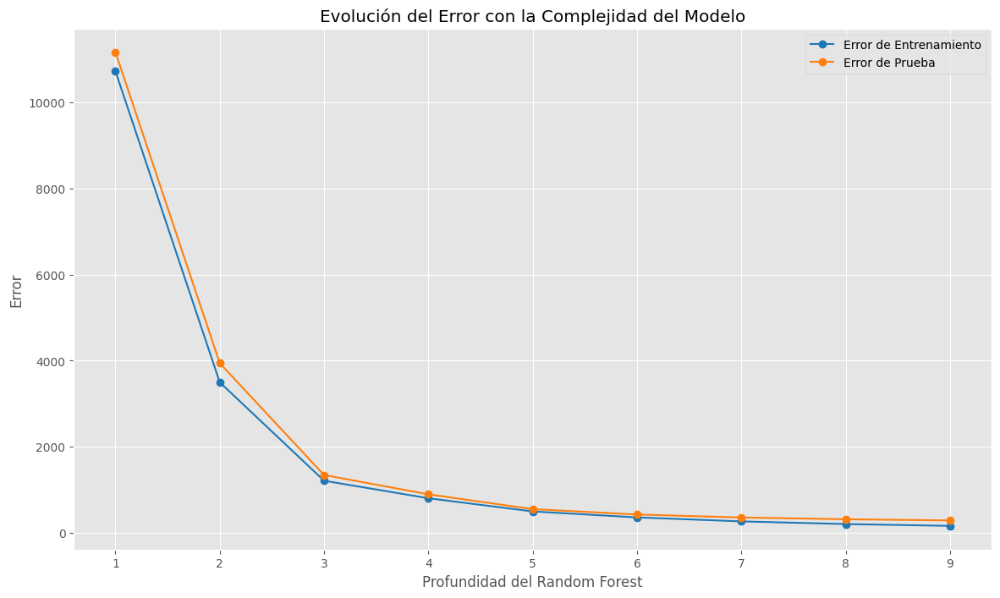

In [ ]:
# Definir las características
X = pd.concat([df_encoded2['PCA_1'], df_encoded2['PCA_2'], df_encoded2['PCA_3'], df_encoded2['carrier_encoded'], df_encoded2['airport_encoded'], df_encoded2['year'], df_encoded2['month']], axis=1)
y = df_encoded['arr_del15']

# Imputar valores faltantes en X
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Dividir los datos en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)

# Rango de complejidades (profundidades del árbol de decisión)
complexities = range(1, 10)

# Listas para almacenar los errores de entrenamiento y prueba
train_errors = []
test_errors = []

# Calcular errores para diferentes complejidades del modelo
for max_depth in complexities:
    # Crear y ajustar el modelo de árbol de decisión con la profundidad especificada
    modelo = RandomForestRegressor(max_depth=max_depth, random_state=42, n_estimators=100)
    modelo.fit(X_train, y_train)

    # Predicciones en el conjunto de entrenamiento y prueba
    y_train_pred = modelo.predict(X_train)
    y_test_pred = modelo.predict(X_test)

    # Calcular los errores de entrenamiento y prueba
    train_error = mean_squared_error(y_train, y_train_pred)
    test_error = mean_squared_error(y_test, y_test_pred)

    # Almacenar los errores
    train_errors.append(train_error)
    test_errors.append(test_error)

# Graficar la evolución de los errores de entrenamiento y prueba
plt.figure(figsize=(14, 8))
plt.plot(complexities, train_errors, label='Error de Entrenamiento', marker='o', color='tab:blue')
plt.plot(complexities, test_errors, label='Error de Prueba', marker='o', color='tab:orange')
plt.xlabel('Profundidad del Random Forest')
plt.ylabel('Error')
plt.title('Evolución del Error con la Complejidad del Modelo')
plt.legend()
plt.grid(True)
plt.show()

Se observa lo mismo en random forest que para los árboles de decisión: diferencias mínimas de error entre set de prueba y de entrenamiento, con una estabilización del error a partir de 5 (aunuqe sigue mejorando al aumentar la profundidad).

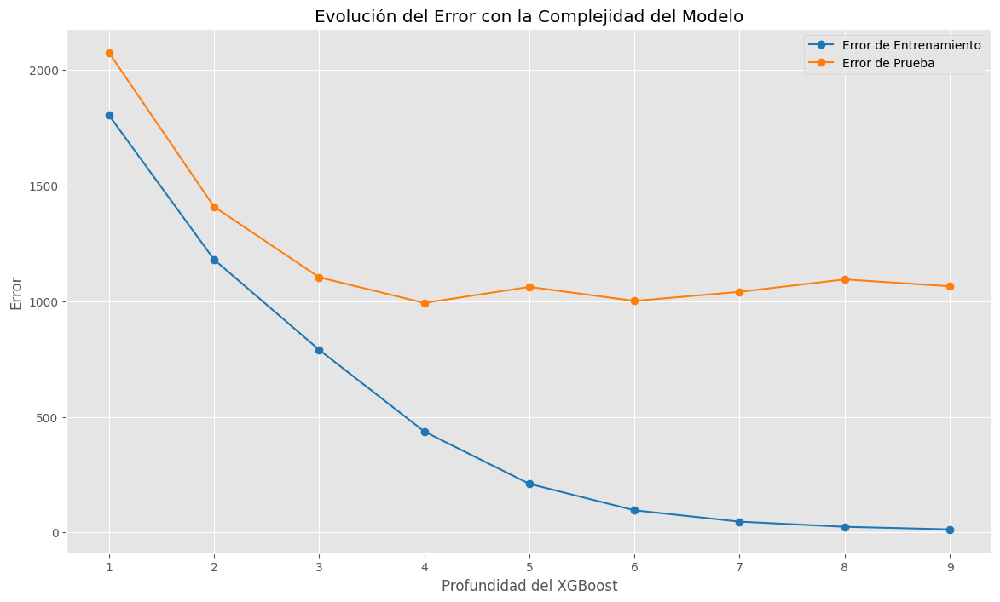

In [ ]:
# Definir las características
X = pd.concat([df_encoded2['PCA_1'], df_encoded2['PCA_2'], df_encoded2['PCA_3'], df_encoded2['carrier_encoded'], df_encoded2['airport_encoded'], df_encoded2['year'], df_encoded2['month']], axis=1)
y = df_encoded['arr_del15']

# Imputar valores faltantes en X
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Dividir los datos en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)

# Rango de complejidades (profundidades del árbol de decisión)
complexities = range(1, 10)

# Listas para almacenar los errores de entrenamiento y prueba
train_errors = []
test_errors = []

# Calcular errores para diferentes complejidades del modelo
for max_depth in complexities:
    # Crear y ajustar el modelo de árbol de decisión con la profundidad especificada
    modelo = XGBRegressor(max_depth=max_depth, random_state=42, n_estimators=100)
    modelo.fit(X_train, y_train)

    # Predicciones en el conjunto de entrenamiento y prueba
    y_train_pred = modelo.predict(X_train)
    y_test_pred = modelo.predict(X_test)

    # Calcular los errores de entrenamiento y prueba
    train_error = mean_squared_error(y_train, y_train_pred)
    test_error = mean_squared_error(y_test, y_test_pred)

    # Almacenar los errores
    train_errors.append(train_error)
    test_errors.append(test_error)

# Graficar la evolución de los errores de entrenamiento y prueba
plt.figure(figsize=(14, 8))
plt.plot(complexities, train_errors, label='Error de Entrenamiento', marker='o', color='tab:blue')
plt.plot(complexities, test_errors, label='Error de Prueba', marker='o', color='tab:orange')
plt.xlabel('Profundidad del XGBoost')
plt.ylabel('Error')
plt.title('Evolución del Error con la Complejidad del Modelo')
plt.legend()
plt.grid(True)
plt.show()

En el caso de XGBoost, al igual que en la primera ronda de análisis refinado, se observa un incremento de la diferencia entre el nivel de error entre el set de entrenamiento y el de prueba a partir de la profundidad 4.

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1054
[LightGBM] [Info] Number of data points in the train set: 119998, number of used features: 7
[LightGBM] [Info] Start training from score 66.544059
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1054
[LightGBM] [Info] Number of data points in the train set: 119998, number of used features: 7
[LightGBM] [Info] Start training from score 66.544059
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1054
[LightGBM] [Info] Number of data points in the train set: 119998, number of used features: 7
[LightGBM] [Info] Start t

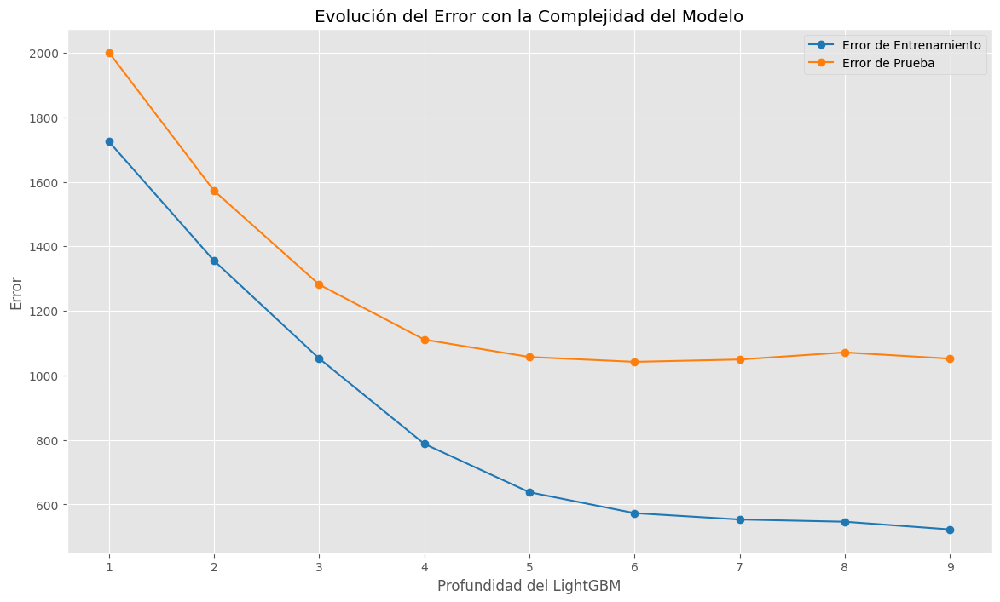

In [ ]:
# Definir las características
X = pd.concat([df_encoded2['PCA_1'], df_encoded2['PCA_2'], df_encoded2['PCA_3'], df_encoded2['carrier_encoded'], df_encoded2['airport_encoded'], df_encoded2['year'], df_encoded2['month']], axis=1)
y = df_encoded['arr_del15']

# Imputar valores faltantes en X
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Dividir los datos en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)

# Rango de complejidades (profundidades del árbol de decisión)
complexities = range(1, 10)

# Listas para almacenar los errores de entrenamiento y prueba
train_errors = []
test_errors = []

# Calcular errores para diferentes complejidades del modelo
for max_depth in complexities:
    # Crear y ajustar el modelo de árbol de decisión con la profundidad especificada
    modelo = LGBMRegressor(max_depth=max_depth, random_state=42, n_estimators=100, num_leaves=20)
    modelo.fit(X_train, y_train)

    # Predicciones en el conjunto de entrenamiento y prueba
    y_train_pred = modelo.predict(X_train)
    y_test_pred = modelo.predict(X_test)

    # Calcular los errores de entrenamiento y prueba
    train_error = mean_squared_error(y_train, y_train_pred)
    test_error = mean_squared_error(y_test, y_test_pred)

    # Almacenar los errores
    train_errors.append(train_error)
    test_errors.append(test_error)

# Graficar la evolución de los errores de entrenamiento y prueba
plt.figure(figsize=(14, 8))
plt.plot(complexities, train_errors, label='Error de Entrenamiento', marker='o', color='tab:blue')
plt.plot(complexities, test_errors, label='Error de Prueba', marker='o', color='tab:orange')
plt.xlabel('Profundidad del LightGBM')
plt.ylabel('Error')
plt.title('Evolución del Error con la Complejidad del Modelo')
plt.legend()
plt.grid(True)
plt.show()

En el caso de LightGBM se produce un efecto bastante similar al observado en XGBoost: un incremento de la diferencia en el nivel de error entre los sets a partir del 4º nivel de profundidad.

##### Crossvalidation y Random Search
Al igual que en la primera ronda de análisis refinado, se realiza el mismo proceso de crossvalidation y de random search, para identificar posibles parámetros con mejores rendimientos, esta vez con las nuevas variables escogidas y con el nuevo pca realizado.

In [ ]:
# Preparación de los datos
X = pd.concat([df_encoded2['PCA_1'], df_encoded2['PCA_2'], df_encoded2['PCA_3'], df_encoded2['carrier_encoded'], df_encoded2['airport_encoded'], df_encoded2['year'], df_encoded2['month']], axis=1)
y = df_encoded['arr_del15']

# Imputación de valores faltantes
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Configuración de StratifiedKFold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Definición de los hiperparámetros a buscar
param_distributions = {
    'Decision Tree': {
        'max_depth': randint(3, 10),
        'min_samples_split': randint(2, 10),
        'min_samples_leaf': randint(1, 10)
    },
    'Random Forest': {
        'n_estimators': randint(10, 100),
        'max_depth': randint(3, 10),
        'min_samples_split': randint(2, 10),
        'min_samples_leaf': randint(1, 10)
    },
    'XGBoost': {
        'n_estimators': randint(50, 100),
        'max_depth': randint(3, 10),
        'learning_rate': uniform(0.01, 0.3),
        'subsample': uniform(0.7, 1.0)
    },
    'LightGBM': {
        'n_estimators': randint(50, 100),
        'max_depth': randint(3, 10),
        'learning_rate': uniform(0.01, 0.3),
        'num_leaves': randint(20, 50)
    }
}

# Definición de los modelos
modelos = {
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42),
    'XGBoost': XGBRegressor(random_state=42, use_label_encoder=False, eval_metric='mae'),
    'LightGBM': LGBMRegressor(random_state=42)
}

# Evaluación de los modelos
resultados = []

for nombre_modelo, modelo in modelos.items():
    print(f'Evaluando {nombre_modelo}...')
    random_search = RandomizedSearchCV(modelo, param_distributions[nombre_modelo],
                                       n_iter=20, scoring='neg_mean_absolute_error',
                                       n_jobs=-1, cv=skf, random_state=42, verbose=1)
    random_search.fit(X_imputed, y)

    mejor_modelo = random_search.best_estimator_
    mejores_params = random_search.best_params_

    # Realizar predicciones con el mejor modelo
    predicciones = mejor_modelo.predict(X_imputed)

    # Calcular métricas
    mae = mean_absolute_error(y, predicciones)
    mse = mean_squared_error(y, predicciones)
    rmse = mean_squared_error(y_test, predicciones, squared=False)
    mape = mean_absolute_percentage_error(y, predicciones)
    r2 = r2_score(y, predicciones)

    # Guardar resultados
    resultados.append({
        'Modelo': nombre_modelo,
        'Mejores Parámetros': mejores_params,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'MAPE': mape,
        'R²': r2
    })

# Crear un DataFrame con los resultados
df_resultados_cross_2 = pd.DataFrame(resultados)

# Mostrar los resultados
print(df_resultados_cross_2)


Evaluando Decision Tree...
Fitting 5 folds for each of 20 candidates, totalling 100 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.



Evaluando Random Forest...
Fitting 5 folds for each of 20 candidates, totalling 100 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.



Evaluando XGBoost...
Fitting 5 folds for each of 20 candidates, totalling 100 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning:


60 fits failed out of a total of 100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/xgboost/core.py", line 730, in inner_f
    return func(**kwargs)
  File "/usr/local/lib/pyt

Evaluando LightGBM...
Fitting 5 folds for each of 20 candidates, totalling 100 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.



[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1053
[LightGBM] [Info] Number of data points in the train set: 171426, number of used features: 7
[LightGBM] [Info] Start training from score 66.355716
          Modelo  \
0  Decision Tree   
1  Random Forest   
2        XGBoost   
3       LightGBM   

                                                                                          Mejores Parámetros  \
0                                            {'max_depth': 9, 'min_samples_leaf': 4, 'min_samples_split': 6}   
1                        {'max_depth': 9, 'min_samples_leaf': 3, 'min_samples_split': 7, 'n_estimators': 90}   
2  {'learning_rate': 0.189597545259111, 'max_depth': 9, 'n_estimators': 68, 'subsample': 0.7999749158180028}   
3               {'learning_rate': 0.30212665

In [ ]:
df_resultados_cross_2

,Modelo,Mejores Parámetros,MAE,MSE,RMSE,MAPE,R²
0,Decision Tree,"{'max_depth': 9, 'min_samples_leaf': 4, 'min_samples_split': 6}",5.662436,236.773061,15.387432,3.911159e+13,0.992647
1,Random Forest,"{'max_depth': 9, 'min_samples_leaf': 3, 'min_samples_split': 7, 'n_estimators': 90}",5.037431,180.093115,13.419878,4.132751e+13,0.994407
2,XGBoost,"{'learning_rate': 0.189597545259111, 'max_depth': 9, 'n_estimators': 68, 'subsample': 0.7999749158180028}",3.212291,48.879856,6.991413,5.741497e+13,0.998482
3,LightGBM,"{'learning_rate': 0.30212665565243774, 'max_depth': 9, 'n_estimators': 96, 'num_leaves': 49}",4.470660,225.375602,15.012515,8.750505e+13,0.993001


A la hora de analizar los resultados, puede observarse lo mismo que se pudo observar en el primer proceso de crossvalidation: los resultados obtenidos reflejan una alta optimización de los modelos, que podrían mostrar un riesgo de overfitting, aunque como no se están refinando todos los parámetros de cada modelo, y se realizó con el stratified k fold, técnicamente habría margen de mejora.

#### Segunda ronda de análisis - Ejecución

##### Regresión lineal

In [ ]:
# Combinar las componentes principales con las variables codificadas
X_combined_2 = pd.concat([df_encoded2['PCA_1'], df_encoded2['PCA_2'], df_encoded2['PCA_3'], df_encoded2['carrier_encoded'], df_encoded2['airport_encoded'], df_encoded2['year'], df_encoded2['month']], axis=1)

# Definir la variable objetivo
y = df_encoded2['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined_2, y, test_size=0.3, random_state=42)

# Entrenar el modelo de regresión lineal
modelo_regresion_lineal = LinearRegression()
modelo_regresion_lineal.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_regresion_lineal.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = mean_squared_error(y_test, predicciones, squared=False)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE", mape)
print("R²:", r2)

MAE: 6.108618339232089
MSE: 325.08837138140495
RMSE: 18.030207191860136
MAPE 311927962989018.6
R²: 0.9899030089082097


Para este primer caso, se observa una ligera mejora en el rendimiento de las distintas métricas con respecto al primer modelo de regresión lineal con encoding, aunque no alcanza el rendimiento del mejor modelo sin encoding ni pca. Sin embargo, debe tenerse en cuenta que las métricas del primer análisis introductorio eran correspondientes al análisis de una muestra.

Métricas del mejor modelo sin encoding ni pca:
* MAE: 1.5525002834959833
* MSE: 19.74829353434921
* RMSE: 4.443905212124715
* MAPE 29976092143548.31
* R²: 0.9993631718788198

Métricas de la primera variante:
* MAE: 6.176033784863376
* MSE: 358.0399425961999
* RMSE: 18.92194341488738
* MAPE 450890361608956.94
* R²: 0.9888795588241526

Métricas de la nueva variante:
* MAE: 6.108618339231859
* MSE: 325.08837138140353
* RMSE: 18.030207191860097
* MAPE 311927962988931.7
* R²: 0.9899030089082097

##### Árboles de decisión

In [ ]:
X_combined_2 = pd.concat([df_encoded2['PCA_1'], df_encoded2['PCA_2'], df_encoded2['PCA_3'], df_encoded2['carrier_encoded'], df_encoded2['airport_encoded'], df_encoded2['year'], df_encoded2['month']], axis=1)
y = df_encoded2['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined_2, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de árbol de decisión para regresión
modelo_arbol = DecisionTreeRegressor(random_state=42, max_depth=5)
modelo_arbol.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_arbol.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = mean_squared_error(y_test, predicciones, squared=False)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape)
print("R²:", r2)

MAE: 10.097539368772308
MSE: 751.6479666291516
RMSE: 27.416198982155635
MAPE: 700881376755312.2
R²: 0.9766544007988747


In [ ]:
X_combined_2 = pd.concat([df_encoded2['PCA_1'], df_encoded2['PCA_2'], df_encoded2['PCA_3'], df_encoded2['carrier_encoded'], df_encoded2['airport_encoded'], df_encoded2['year'], df_encoded2['month']], axis=1)
y = df_encoded2['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined_2, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de árbol de decisión para regresión
modelo_arbol = DecisionTreeRegressor(random_state=42, max_depth=9, min_samples_leaf=4, min_samples_split=6)
modelo_arbol.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_arbol.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = mean_squared_error(y_test, predicciones, squared=False)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape)
print("R²:", r2)

MAE: 6.359298498458481
MSE: 403.8097951426166
RMSE: 20.095019162534197
MAPE: 38712801356766.61
R²: 0.9874579829262823


Para este modelo se observa una disminución de los rendimientos obtenidos por esta ronda de análisis, obteniendo métricas inferiores en forma generalizada a las obtenidas en la primera ronda.

Primera ronda:
* MAE: 7.026927335775493
* MSE: 361.4102350670015
* RMSE: 19.01079259439231
* MAPE: 647861919771111.0
* R²: 0.9887748801704381

Primera ronda con parámetros de crossvalidation:
* MAE: 4.783984743392565
* MSE: 241.06663791789327
* RMSE: 15.526320810735983
* MAPE: 0.11191029487572361
* R²: 0.9925126583727318

Segunda ronda:
* MAE: 10.097539368772308
* MSE: 751.6479666291516
* RMSE: 27.416198982155635
* MAPE: 700881376755312.2
* R²: 0.9766544007988747

Segunda ronda con parámetros de crossvalidation:
* MAE: 6.359298498458481
* MSE: 403.8097951426166
* RMSE: 20.095019162534197
* MAPE: 38712801356766.61
* R²: 0.9874579829262823


##### Random Forest

In [ ]:
X_combined_2 = pd.concat([df_encoded2['PCA_1'], df_encoded2['PCA_2'], df_encoded2['PCA_3'], df_encoded2['carrier_encoded'], df_encoded2['airport_encoded'], df_encoded2['year'], df_encoded2['month']], axis=1)
y = df_encoded2['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined_2, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de Random Forest Regressor
modelo_rf = RandomForestRegressor(n_estimators=100, max_depth=5, random_state=42)
modelo_rf.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_rf.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = mean_squared_error(y_test, predicciones, squared=False)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape)
print("R²:", r2)

MAE: 8.975378994631301
MSE: 548.4039785425672
RMSE: 23.418026785845285
MAPE: 711283450388403.8
R²: 0.9829670004420115


In [ ]:
X_combined_2 = pd.concat([df_encoded2['PCA_1'], df_encoded2['PCA_2'], df_encoded2['PCA_3'], df_encoded2['carrier_encoded'], df_encoded2['airport_encoded'], df_encoded2['year'], df_encoded2['month']], axis=1)
y = df_encoded2['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined_2, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de Random Forest Regressor
modelo_rf = RandomForestRegressor(max_depth=9, min_samples_leaf=3, min_samples_split=7, n_estimators=90, random_state=42)
modelo_rf.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_rf.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = mean_squared_error(y_test, predicciones, squared=False)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape)
print("R²:", r2)

MAE: 5.495282091817219
MSE: 287.39368706050044
RMSE: 16.952689670388605
MAPE: 40163503239097.31
R²: 0.9910737763834617


Al igual que en el caso de los árboles de decisión, se observa una disminución de las métricas de los modelos de la segunda ronda, en particular comparando las versiones sin crossvalidation entre sí y las que tienen crossvalidation entre sí, donde puede observarse en términos generales un rendimiento inferior.

Primera ronda:
* MAE: 6.396582311588653
* MSE: 326.0408441724321
* RMSE: 18.056601124586876
* MAPE: 647764363011514.4
* R²: 0.9898734258467015

Primera ronda con parámetros de crossvalidation:
* MAE: 4.415048302326371
* MSE: 194.15736110630536
* RMSE: 13.93403606663573
* MAPE: 0.10762432904398125
* R²: 0.9939696238989864

Segunda ronda:
* MAE: 8.975378994631301
* MSE: 548.4039785425672
* RMSE: 23.418026785845285
* MAPE: 711283450388403.8
* R²: 0.9829670004420115

Segunda ronda con parámetros de crossvalidation:
* MAE: 5.495282091817219
* MSE: 287.39368706050044
* RMSE: 16.952689670388605
* MAPE: 40163503239097.31
* R²: 0.9910737763834617


##### XGBoost

In [ ]:
# Combinar las componentes principales con las variables codificadas
X_combined_2 = pd.concat([df_encoded2['PCA_1'], df_encoded2['PCA_2'], df_encoded2['PCA_3'], df_encoded2['carrier_encoded'], df_encoded2['airport_encoded'], df_encoded2['year'], df_encoded2['month']], axis=1)

# Definir la variable objetivo
y = df_encoded2['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined_2, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de XGBoost Regressor
modelo_xgb = XGBRegressor(n_estimators=100, max_depth=5, random_state=42)
modelo_xgb.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_xgb.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = mean_squared_error(y_test, predicciones, squared=False)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape)
print("R²:", r2)

MAE: 6.0258012249190545
MSE: 1062.1508465730697
RMSE: 32.5906558168606
MAPE: 83421461166796.48
R²: 0.9670104236875225


In [ ]:
# Combinar las componentes principales con las variables codificadas
X_combined_2 = pd.concat([df_encoded2['PCA_1'], df_encoded2['PCA_2'], df_encoded2['PCA_3'], df_encoded2['carrier_encoded'], df_encoded2['airport_encoded'], df_encoded2['year'], df_encoded2['month']], axis=1)

# Definir la variable objetivo
y = df_encoded2['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined_2, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de XGBoost Regressor
modelo_xgb = XGBRegressor(learning_rate=0.189597545259111, max_depth=9, n_estimators=68, subsample=0.7999749158180028, random_state=42)
modelo_xgb.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_xgb.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = mean_squared_error(y_test, predicciones, squared=False)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape)
print("R²:", r2)

MAE: 5.548765712183159
MSE: 1037.053832692234
RMSE: 32.203320212242616
MAPE: 54886176471083.62
R²: 0.9677899173510718


Al igual que en los análisis anteriores, se observa un rendimiento en general inferior a los obtenidos en la primera ronda de análisis, observándose mejores métricas en el proceso con los parámetros de crossvalidation.

Primera ronda:
* MAE: 4.836328114780457
* MSE: 727.8959513532116
* RMSE: 26.97954690785617
* MAPE: 65023423481566.69
* R²: 0.9773921198554935

Primera ronda con crossvalidation:
* MAE: 4.5917910235114485
* MSE: 826.5228666552102
* RMSE: 28.749310716175618
* MAPE: 24720751010902.676
* R²: 0.9743288448420458

Segunda ronda:
* MAE: 6.0258012249190545
* MSE: 1062.1508465730697
* RMSE: 32.5906558168606
* MAPE: 83421461166796.48
* R²: 0.9670104236875225

Segunda ronda con crossvalidation:
* MAE: 5.548765712183159
* MSE: 1037.053832692234
* RMSE: 32.203320212242616
* MAPE: 54886176471083.62
* R²: 0.9677899173510718

##### LightGBM

In [ ]:
# Combinar las componentes principales con las variables codificadas
X_combined_2 = pd.concat([df_encoded2['PCA_1'], df_encoded2['PCA_2'], df_encoded2['PCA_3'], df_encoded2['carrier_encoded'], df_encoded2['airport_encoded'], df_encoded2['year'], df_encoded2['month']], axis=1)

# Definir la variable objetivo
y = df_encoded2['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined_2, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de LightGBM Regressor
modelo_lgbm = LGBMRegressor(n_estimators=100, max_depth=5, num_leaves=20, random_state=42)
modelo_lgbm.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_lgbm.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = mean_squared_error(y_test, predicciones, squared=False)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape)
print("R²:", r2)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1054
[LightGBM] [Info] Number of data points in the train set: 119998, number of used features: 7
[LightGBM] [Info] Start training from score 66.544059
MAE: 6.147578057372957
MSE: 1057.031047583744
RMSE: 32.512013896154514
MAPE: 192137032836551.5
R²: 0.9671694406482564


In [ ]:
# Combinar las componentes principales con las variables codificadas
X_combined_2 = pd.concat([df_encoded2['PCA_1'], df_encoded2['PCA_2'], df_encoded2['PCA_3'], df_encoded2['carrier_encoded'], df_encoded2['airport_encoded'], df_encoded2['year'], df_encoded2['month']], axis=1)

# Definir la variable objetivo
y = df_encoded2['arr_del15']

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_combined_2, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo de LightGBM Regressor
modelo_lgbm = LGBMRegressor(learning_rate=0.30212665565243774, max_depth=9, n_estimators=96, num_leaves=49, random_state=42)
modelo_lgbm.fit(X_train, y_train)

# Realizar predicciones en los datos de prueba
predicciones = modelo_lgbm.predict(X_test)

# Evaluar el modelo
mae = mean_absolute_error(y_test, predicciones)
mse = mean_squared_error(y_test, predicciones)
rmse = mean_squared_error(y_test, predicciones, squared=False)
mape = mean_absolute_percentage_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape)
print("R²:", r2)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1054
[LightGBM] [Info] Number of data points in the train set: 119998, number of used features: 7
[LightGBM] [Info] Start training from score 66.544059
MAE: 5.920229032472648
MSE: 1105.69618777844
RMSE: 33.252010281762516
MAPE: 92498597256030.88
R²: 0.9656579393757299


Nuevamente, en LightGBM, se observa un rendimiento inferior al de las métricas obtenidas en la primera ronda en general. En este caso, se observa también que las métricas de la segunda ronda son ligeramente superiores en el modelo sin parámetros obtenidos del proceso de crossvalidation, con excepción del MAPE.

Primera ronda:
* MAE: 5.075912114380039
* MSE: 785.763639659028
* RMSE: 28.031475873721455
* MAPE: 112977441731243.95
* R²: 0.9755947946209934

Primera ronda con crossvalidation:
* MAE: 4.792188821316534
* MSE: 876.0806649782411
* RMSE: 29.598659851051384
* MAPE: 41377887174601.125
* R²: 0.9727896183047505

Segunda ronda:
* MAE: 6.147578057372957
* MSE: 1057.031047583744
* RMSE: 32.512013896154514
* MAPE: 192137032836551.5
* R²: 0.9671694406482564

Segunda ronda con crossvalidation:
* MAE: 5.920229032472648
* MSE: 1105.69618777844
* RMSE: 33.252010281762516
* MAPE: 92498597256030.88
* R²: 0.9656579393757299

##### Agrupación de resultados

In [ ]:
def evaluar_modelos(df_encoded2, modelos):
    resultados2 = []

    # Combinar las componentes principales con las variables codificadas
    X_combined = pd.concat([df_encoded2['PCA_1'], df_encoded2['PCA_2'], df_encoded2['PCA_3'],
                            df_encoded2['carrier_encoded'], df_encoded2['airport_encoded'],
                            df_encoded2['year'], df_encoded2['month']], axis=1)

    # Definir la variable objetivo
    y = df_encoded2['arr_del15']

    # Dividir los datos en conjunto de entrenamiento y prueba
    X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.3, random_state=42)

    for nombre_modelo, modelo in modelos.items():
        # Entrenar el modelo
        modelo.fit(X_train, y_train)

        # Realizar predicciones
        predicciones = modelo.predict(X_test)

        # Calcular métricas
        mae = mean_absolute_error(y_test, predicciones)
        mse = mean_squared_error(y_test, predicciones)
        rmse = mean_squared_error(y_test, predicciones, squared=False)  # Para obtener el RMSE
        mape = mean_absolute_percentage_error(y_test, predicciones)
        r2 = r2_score(y_test, predicciones)

        # Guardar resultados
        resultados2.append({
            'Modelo': nombre_modelo,
            'MAE': mae,
            'MSE': mse,
            'RMSE': rmse,
            'MAPE': mape,
            'R²': r2
        })

    # Crear un DataFrame con los resultados
    df_resultados2 = pd.DataFrame(resultados2)

    return df_resultados2

# Definir los modelos a evaluar
modelos = {
    'Linear Regression': LinearRegression(),
    'Decision Tree Regressor 1': DecisionTreeRegressor(random_state=42, max_depth=5),
    'Decision Tree Regressor 2': DecisionTreeRegressor(random_state=42, max_depth=9, min_samples_leaf=4, min_samples_split=6),
    'Random Forest 1': RandomForestRegressor(n_estimators=100, max_depth=5, random_state=42),
    'Random Forest 2': RandomForestRegressor(max_depth=9, min_samples_leaf=3, min_samples_split=7, n_estimators=90, random_state=42),
    'XGBoost 1': XGBRegressor(n_estimators=100, max_depth=5, random_state=42),
    'XGBoost 2': XGBRegressor(learning_rate=0.189597545259111, max_depth=9, n_estimators=68, subsample=0.7999749158180028, random_state=42),
    'LightGBM 1': LGBMRegressor(n_estimators=100, max_depth=5, num_leaves=20, random_state=42),
    'LightGBM 2': LGBMRegressor(learning_rate=0.30212665565243774, max_depth=9, n_estimators=96, num_leaves=49, random_state=42)
}

# Llamar a la función y obtener los resultados
df_resultados2 = evaluar_modelos(df_encoded2, modelos)

# Mostrar los resultados
df_resultados2

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1054
[LightGBM] [Info] Number of data points in the train set: 119998, number of used features: 7
[LightGBM] [Info] Start training from score 66.544059
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1054
[LightGBM] [Info] Number of data points in the train set: 119998, number of used features: 7
[LightGBM] [Info] Start training from score 66.544059


,Modelo,MAE,MSE,RMSE,MAPE,R²
0,Linear Regression,6.108618,325.088371,18.030207,3.119280e+14,0.989903
1,Decision Tree Regressor 1,10.097539,751.647967,27.416199,7.008814e+14,0.976654
2,Decision Tree Regressor 2,6.359298,403.809795,20.095019,3.871280e+13,0.987458
3,Random Forest 1,8.975379,548.403979,23.418027,7.112835e+14,0.982967
4,Random Forest 2,5.495282,287.393687,16.952690,4.016350e+13,0.991074
5,XGBoost 1,6.025801,1062.150847,32.590656,8.342146e+13,0.967010
6,XGBoost 2,5.548766,1037.053833,32.203320,5.488618e+13,0.967790
7,LightGBM 1,6.147578,1057.031048,32.512014,1.921370e+14,0.967169
8,LightGBM 2,5.920229,1105.696188,33.252010,9.249860e+13,0.965658


Al igual que en la primera ronda, se observa que el modelo con mejores métricas resulta ser el de random forest con crossvalidation, seguido en este caso por la regresión lineal, que presenta métricas muy buenas también, sin haber tenido que ser refinado.

#### Comparativo de rondas de análisis

In [ ]:
#Resultados primera ronda
df_resultados

,Modelo,MAE,MSE,RMSE,MAPE,R²
0,Linear Regression,6.176034,358.039943,18.921943,4.508904e+14,0.988880
1,Decision Tree Regressor 1,7.026927,361.410235,19.010793,6.478619e+14,0.988775
2,Decision Tree Regressor 2,4.783985,241.066638,15.526321,1.119103e-01,0.992513
3,Random Forest 1,6.396582,326.040844,18.056601,6.477644e+14,0.989873
4,Random Forest 2,4.415048,194.157361,13.934036,1.076243e-01,0.993970
5,XGBoost 1,4.836328,727.895951,26.979547,6.502342e+13,0.977392
6,XGBoost 2,4.591791,826.522867,28.749311,2.472075e+13,0.974329
7,LightGBM 1,5.075912,785.763640,28.031476,1.129774e+14,0.975595
8,LightGBM 2,4.792189,876.080665,29.598660,4.137789e+13,0.972790


In [ ]:
#Resultados segunda ronda
df_resultados2

,Modelo,MAE,MSE,RMSE,MAPE,R²
0,Linear Regression,6.108618,325.088371,18.030207,3.119280e+14,0.989903
1,Decision Tree Regressor 1,10.097539,751.647967,27.416199,7.008814e+14,0.976654
2,Decision Tree Regressor 2,6.359298,403.809795,20.095019,3.871280e+13,0.987458
3,Random Forest 1,8.975379,548.403979,23.418027,7.112835e+14,0.982967
4,Random Forest 2,5.495282,287.393687,16.952690,4.016350e+13,0.991074
5,XGBoost 1,6.025801,1062.150847,32.590656,8.342146e+13,0.967010
6,XGBoost 2,5.548766,1037.053833,32.203320,5.488618e+13,0.967790
7,LightGBM 1,6.147578,1057.031048,32.512014,1.921370e+14,0.967169
8,LightGBM 2,5.920229,1105.696188,33.252010,9.249860e+13,0.965658


En base a la información obtenida, puede observarse cómo, en forma general, el rendimiento de los modelos de la segunda ronda es inferior al de la primera ronda, con excepción de la regresión lineal, cuyo rendimiento mejoró con respecto a la primera ronda, conforme se observa en sus métricas. De cualquier manera, el modelo que mejores métricas arrojó, en forma general, fue el de Random Forest con crossvalidation de la primera ronda, seguido por el de árboles de decisión con crossvalidation.

A manera de cierre del análisis de la hipótesis, y en base a las métricas obtenidas de los análisis y modelos realizados, se considera confirmada la hipótesis de que puede predecirse, en forma aproximada, la cantidad de demoras que pueden haber en los vuelos registrados por aeropuerto y aerolínea, habiéndose podido obtener métricas con muy buen nivel de rendimiento con todos los modelos, destacando que el valor de R² obtenido en todos los modelos, en ambas rondas, es superior a 0,95, en cinco modelos de machine learning distintos.

# Conclusión
El análisis realizado en el presente trabajo resulta un primer vistazo a los cielos, y a la información que estos pueden dar a quienes deseen estudiarlo. Al estudiar los datos con detenimiento, puede no solo comprenderse la composición y clasificación de los vuelos, de los tipos y relevancia de las demoras. Pueden observarse la presencia y los efectos de eventos extraordinarios (como la pandemia de Covid-19), la existencia de flucturaciones estacionarias en el tiempo, y pueden predecirse las posibilidades de ocurrencia de demoras y la significancia de las mismas.

A la hora de analizar la hipótesis de predicción de demoras, se lograron desarrollar cinco distintos modelos de regresión con buenas métricas y varias versiones, siendo el más eficiente el segundo modelo de random forest obtenido en la primera ronda de análisis.

Con un análisis más específico, y con procesos que pueden realizarse a futuro, podrán realizarse también predicciones de demoras por aeropuerto, por carrier u otras clasificaciones, y podrán realizarse análisis comparativos más profundos entre los distintos carriers y aeropuertos, así como de la relevancia de los distintos tipos de demora.